### A Generative Adversarial Network to mimic orbits around chaotic attractor

We train a Generative adversarial network (GAN) to re-produce the orbital dynamics around a chaotic attractor. For our chaotic system we use the so--called Henon map, a 2-dimensional Poincare map on the x-y plane (i.e a discrete, 2-dimensional dynamnical system). It corresponds to a very popular dynamical system exhibiting chaotic behaviour. A key feature of the map is the existence of a so--called ``strange attractor" for certain values of the parameters, which is a characteristic invariant manifold formed around an unstable fixed point. 

$$
x_n = 1-ax_{n-1}^2 + y_{n-1}
$$
$$
y_n = bx_{n-1}
$$

The attractor exists for a = 1.4 and b = 0.3. 

Our GAN network consists of a **generator (G)** and **discriminator (D)**. The generator G will be producing mock orbits drawing points from a latent space, and it will be passing them to the discriminator D together with a label. The task of D will be to classify the orbits as true (label = 1) or not true (label = 0). As the combined system of G and D gets trained, it gradually reaches an equilibirum (Nash equilibrium) where it is considered to be trained. At that point, the network is capable to produce artificial samples of the training set which are sufficiently close to the actual training data. This is achieved by learning the probability density underlying the data - therefore, each time the network is evaluated to produce an ouput, the outcome is a particular **realisation** of the actual data. 

In [1]:
import numpy as np
from numpy import hstack, zeros, ones
from numpy.random import rand, randn
from numpy.random import randn
from keras.models import Sequential
from keras.layers import Dense
from matplotlib import pyplot
%matplotlib inline 

# This defines the map from which we will generate the training data 
def Henon(a, b, n_points = 10000, x0 = 0, y0 = 0):
  # Defines the Henon map with a, b free, real parameters.
  # n_points the number of evaluations/iterations.
  # x0,y0 initial point on the y-x plane.
    x=np.zeros(n_points)
    y=np.zeros(n_points)
    data_Henon = []
    x[0] = x0
    y[0] = y0
    for n in range (1,n_points):
        x[n]=1-a*x[n-1]**2 + y[n-1]
        y[n]=b*x[n-1]
  #x = np.array(x)
  #y = np.array(y)
        data_Henon.append([x[n],y[n]])

    return data_Henon

def G(latent_dim, n_outputs=2):
 # This is the generator. It is not compiled here. The reason is that it will be compiled later
 # when combining both the generator and discriminator together in the GAN. 
 # dim_input = latent_dim, dim_output = 2.
 # The activation in the output layer is linear, but can be changed.
    model = Sequential()
    model.add(Dense(15, activation='relu', kernel_initializer='he_uniform', input_dim=latent_dim))
    model.add(Dense(n_outputs, activation='linear'))
    return model

def D(n_inputs=2):
  # This is the discriminator. It is compiled because it will be trained separately during the training loop.
  # The loss function is binary-like because we are classifying 0 or 1 (true or false).
  #  dim_input = 2, dim_output = 1
  # Notice the different activation in the output layers, compared to the generator.
  # sigmoid function ensures that output is in the range [0,1]
    model = Sequential()
    model.add(Dense(25, activation='relu', kernel_initializer='he_uniform', input_dim=n_inputs))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def GAN(generator, discriminator):
  # This is the combined generator + discriminator = GAN, as a simple sequential model.
  # It is compiled with a binary loss function (classification problem: 0 or 1).
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    model.compile(loss='binary_crossentropy', optimizer='adam')
    return model


def data_real(n):
  # This function produces the real data. .
  # These will be provided to the discriminator when trained. Notice that we attach labels to these data = 1, which means real.
    X = Henon( 1.4, 0.3, n_points=n+1, x0=0.000, y0=0.0000001*(1+randn(1)) ) # we add a small amount of noise on y0
    X = np.array(X)
    y = ones((n, 1)) # we choose labels = 1, because the data are real
    return X, y 

def data_rand(latent_dim, n): #
  # This is producing fake data which will be fed into the generator. The variable "latent_dim" is the number of elements (columns) in the
  # n-dimensional vector of data. In total, we produce latent_dim*n number of random data.
    x_input = randn(latent_dim * n) - 0.5
    x_input = x_input.reshape(n, latent_dim)
    return x_input

# Use the generator to generate n number of fake examples, with class labels = 1 (real), in order to trick the discriminator.
def data_G(generator, latent_dim, n):
    x_input = data_rand(latent_dim, n)
    X = generator.predict(x_input) # This produces an (n x latent_dim) vector, with. predicted images by the generator
    y = zeros((n, 1)) # Add class labels = 1, i.e real. This is to trick the discriminator.
    return X, y

# Evaluate the discriminator and plot real and fake points
def summarize_performance(epoch, generator, discriminator, latent_dim, n=1000):
 # prepare real samples
    x_real, y_real = data_real(n)
 # evaluate discriminator on real examples
    _, acc_real = discriminator.evaluate(x_real, y_real, verbose=0)   
 # gan = GAN(generator, discriminator)
    results_D = discriminator.evaluate(x_real, y_real, verbose=0)
 # prepare fake examples
    x_fake, y_fake = data_G(generator, latent_dim, n)
 # evaluate discriminator on fake examples
    _, acc_fake = discriminator.evaluate(x_fake, y_fake, verbose=0)
 # summarize discriminator performance
    print(epoch, acc_real, acc_fake)
 # scatter plot real and fake data points
    pyplot.scatter(x_real[:, 0], x_real[:, 1], color='red', s = 0.2)
    pyplot.scatter(x_fake[:, 0], x_fake[:, 1], color='blue', s = 0.2)
    pyplot.show()

# Here we set up a loop of n_epochs to train the combined system (GAN). At each epoch, we train the discriminator with both fake and real data.
def train(g_model, d_model, gan_model, latent_dim, n_epochs=25000, n_batch=500, n_eval=100):
    half_batch = int(n_batch/2)
    for i in range(n_epochs):
        x_real, y_real = data_real(half_batch) # Produce REAL DATA
        x_fake, y_fake = data_G(g_model, latent_dim, half_batch) # Produce fake data by the Generator
        d_model.train_on_batch(x_real, y_real) # Train discriminator with real data.
        d_model.train_on_batch(x_fake, y_fake) # Train discriminator with fake data produced by Generator.
        x_gan = data_rand(latent_dim, n_batch) # Input for generator: data+labels
        y_gan = ones((n_batch, 1))
        gan_model.train_on_batch(x_gan, y_gan)  # Update the generator via the discriminator's error
        if (i+1) % n_eval == 0: # Evaluate the model every n_eval epochs
              summarize_performance(i, g_model, d_model, latent_dim)



2024-03-23 14:36:59.069228: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-23 14:36:59.069281: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-23 14:36:59.112486: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-23 14:36:59.227484: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-03-23 14:39:58.898075: I tensorflow/core/common_runtime/gpu/gpu_process_state.cc:236] Using CUDA malloc Async allocator for GPU: 0
2024-03-23 14:39:58.899932: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 74363 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:07:00.0, compute capability: 8.0


8/8 [==============================] - 1s 896us/step


2024-03-23 14:40:01.477067: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fc381d34240 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-23 14:40:01.477087: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A100-SXM4-80GB, Compute Capability 8.0
2024-03-23 14:40:01.507042: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-03-23 14:40:01.534290: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
I0000 00:00:1711201201.594399  689414 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


32/32 [==============================] - 0s 673us/step
99 0.6729999780654907 0.6330000162124634


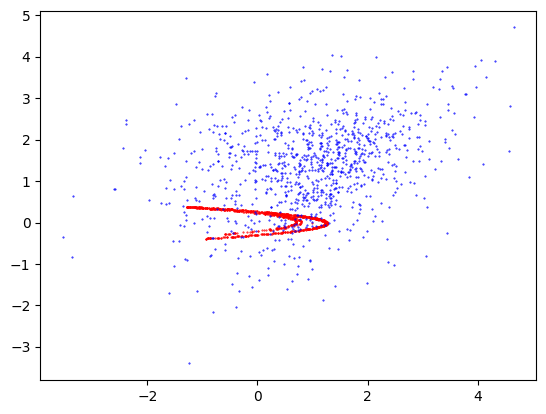

32/32 [==============================] - 0s 670us/step
199 0.24300000071525574 0.6660000085830688


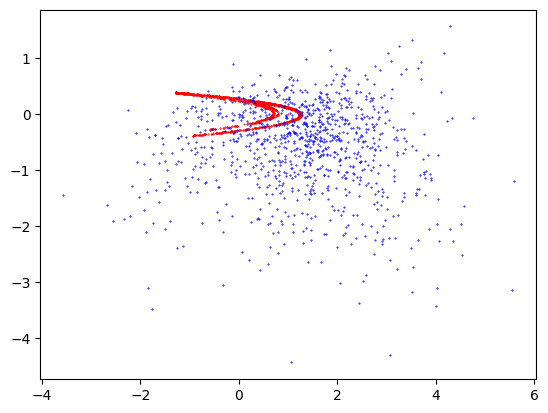

32/32 [==============================] - 0s 703us/step
299 0.22100000083446503 0.8550000190734863


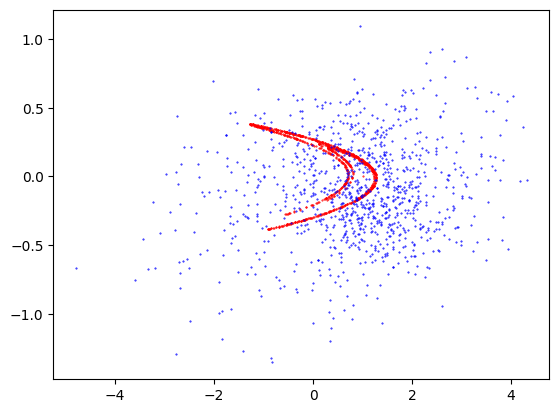

32/32 [==============================] - 0s 649us/step
399 0.1340000033378601 0.8930000066757202


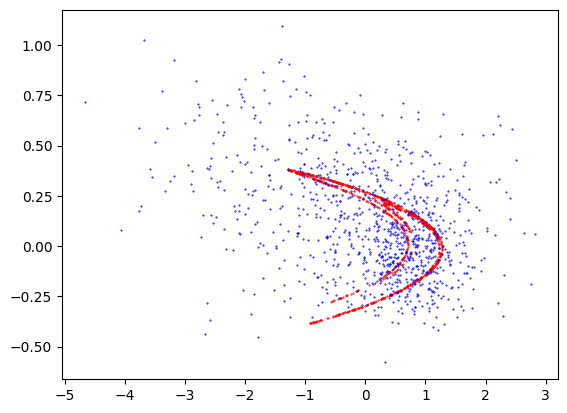

32/32 [==============================] - 0s 665us/step
499 0.19599999487400055 0.6819999814033508


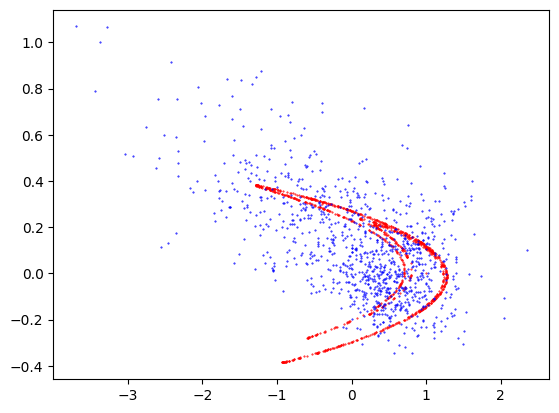

32/32 [==============================] - 0s 695us/step
599 0.6019999980926514 0.3179999887943268


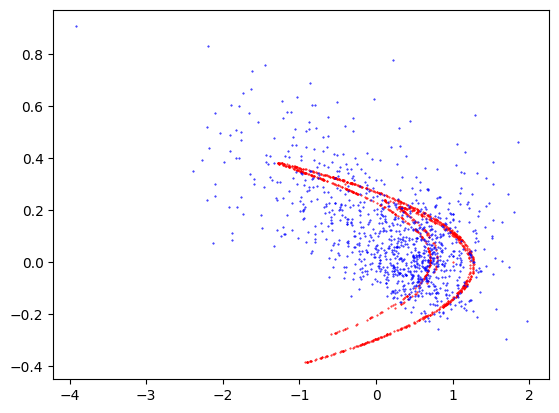

32/32 [==============================] - 0s 688us/step
699 0.7680000066757202 0.17800000309944153


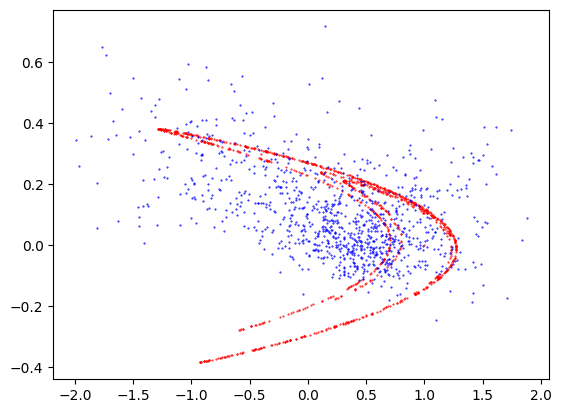

32/32 [==============================] - 0s 640us/step
799 0.8450000286102295 0.15000000596046448


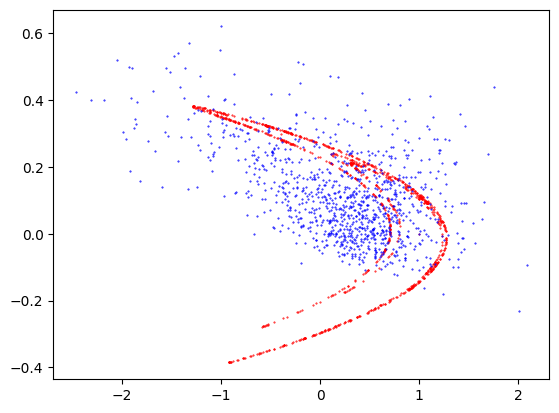

32/32 [==============================] - 0s 689us/step
899 0.8529999852180481 0.296999990940094


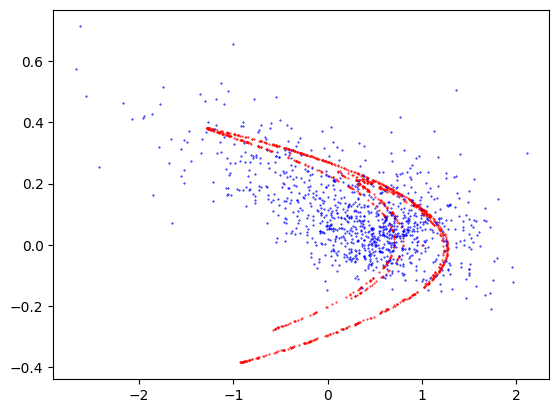

32/32 [==============================] - 0s 671us/step
999 0.5 0.6520000100135803


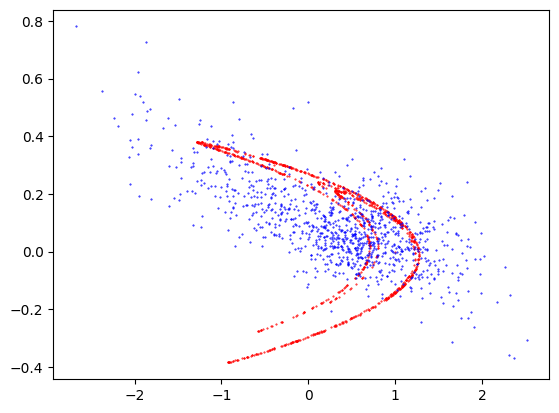

32/32 [==============================] - 0s 666us/step
1099 0.3009999990463257 0.9110000133514404


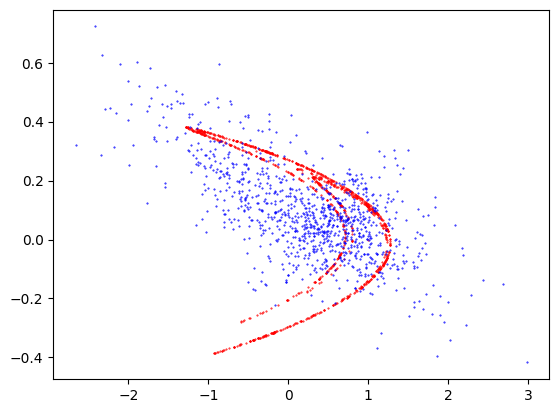

32/32 [==============================] - 0s 646us/step
1199 0.30799999833106995 0.8700000047683716


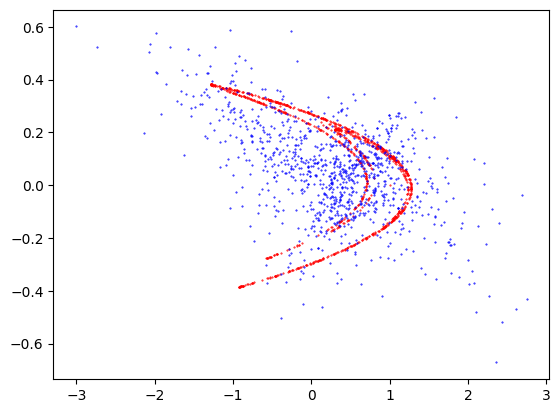

32/32 [==============================] - 0s 698us/step
1299 0.5649999976158142 0.6050000190734863


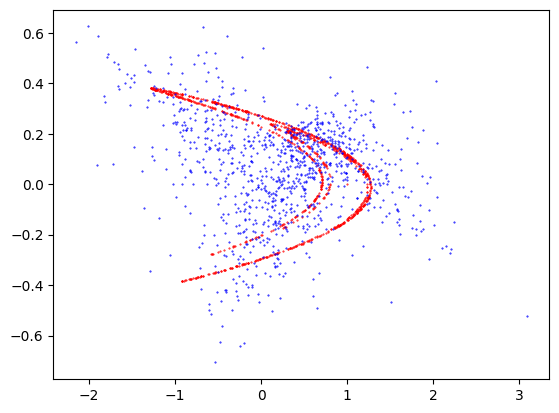

32/32 [==============================] - 0s 683us/step
1399 0.8050000071525574 0.4740000069141388


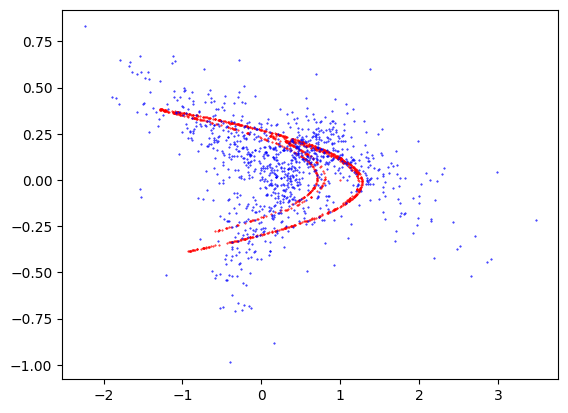

32/32 [==============================] - 0s 660us/step
1499 0.6570000052452087 0.4569999873638153


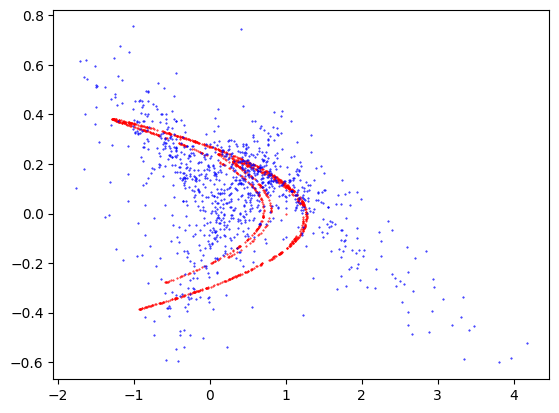

32/32 [==============================] - 0s 682us/step
1599 0.4950000047683716 0.7300000190734863


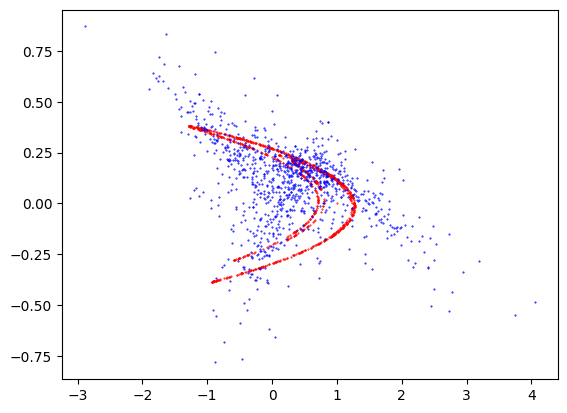

32/32 [==============================] - 0s 635us/step
1699 0.5040000081062317 0.7179999947547913


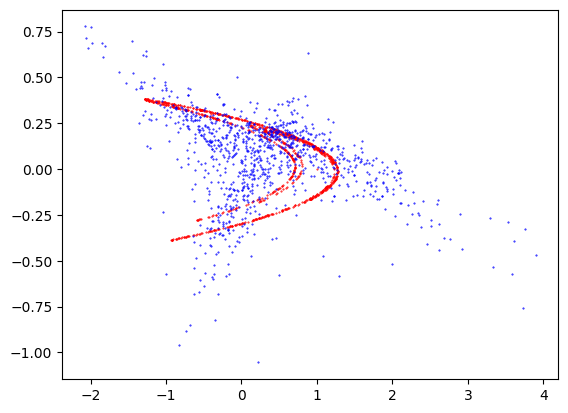

32/32 [==============================] - 0s 652us/step
1799 0.5809999704360962 0.5830000042915344


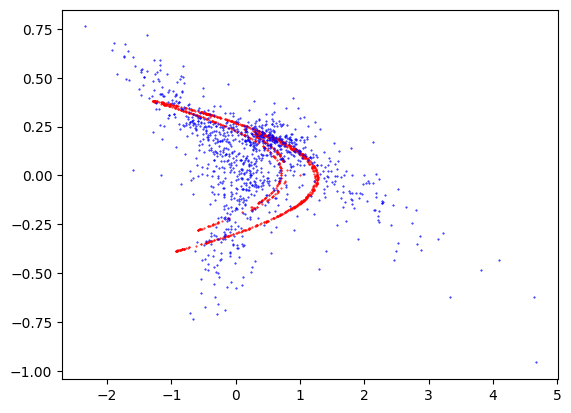

32/32 [==============================] - 0s 719us/step
1899 0.5929999947547913 0.5619999766349792


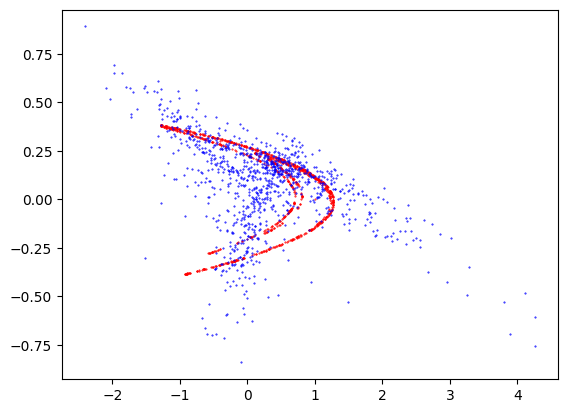

32/32 [==============================] - 0s 701us/step
1999 0.5479999780654907 0.6200000047683716


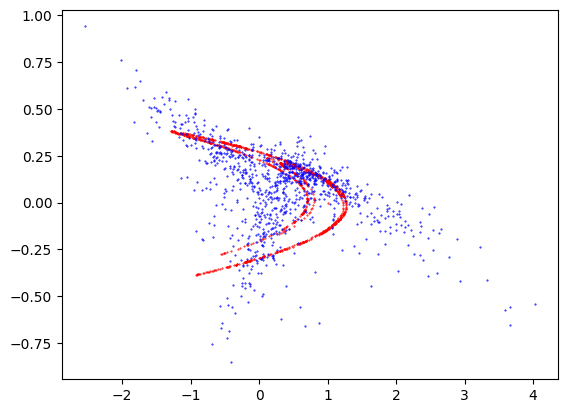

32/32 [==============================] - 0s 618us/step
2099 0.6650000214576721 0.5019999742507935


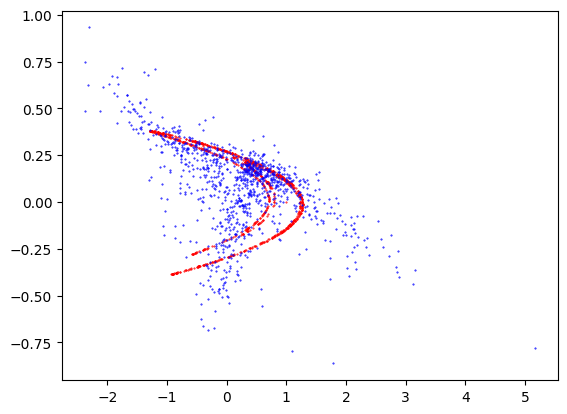

32/32 [==============================] - 0s 626us/step
2199 0.5450000166893005 0.5740000009536743


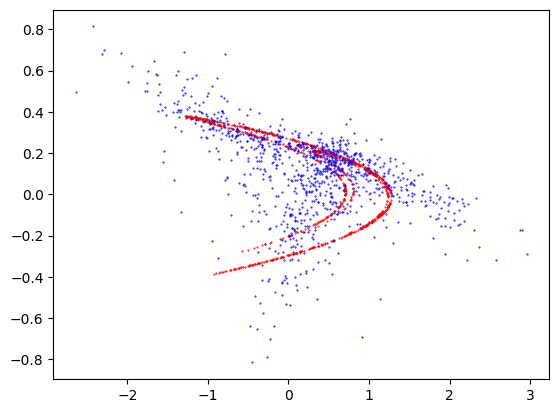

32/32 [==============================] - 0s 822us/step
2299 0.6660000085830688 0.5600000023841858


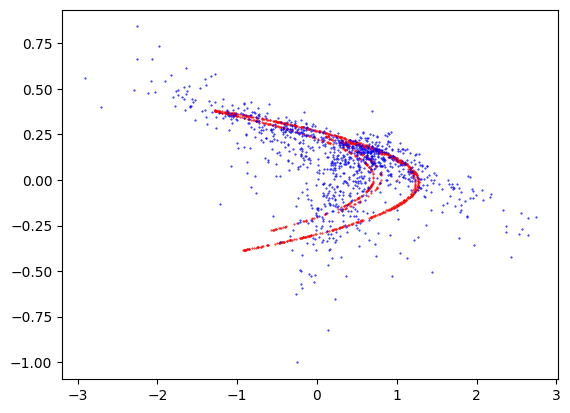

32/32 [==============================] - 0s 702us/step
2399 0.5320000052452087 0.5910000205039978


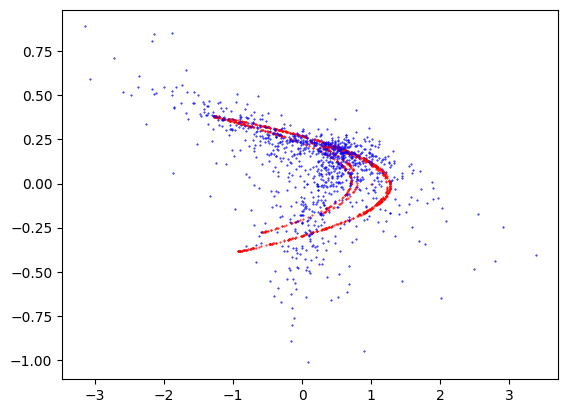

32/32 [==============================] - 0s 722us/step
2499 0.6399999856948853 0.5109999775886536


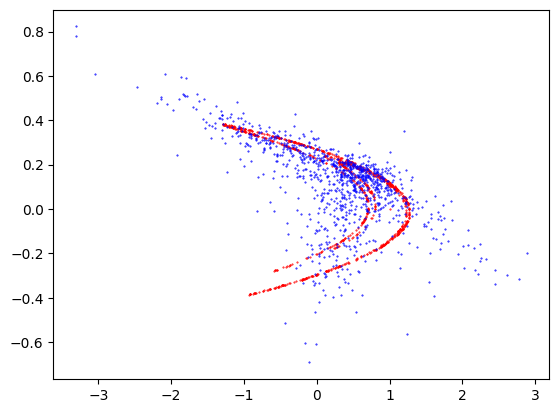

32/32 [==============================] - 0s 630us/step
2599 0.5609999895095825 0.6690000295639038


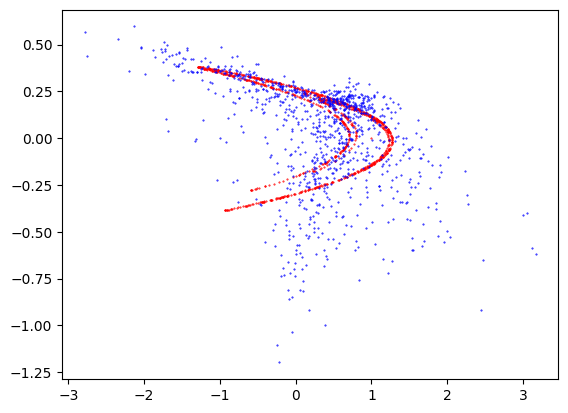

32/32 [==============================] - 0s 651us/step
2699 0.7329999804496765 0.460999995470047


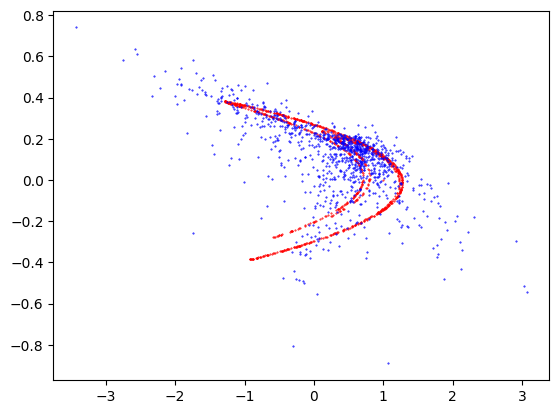

32/32 [==============================] - 0s 650us/step
2799 0.5460000038146973 0.5899999737739563


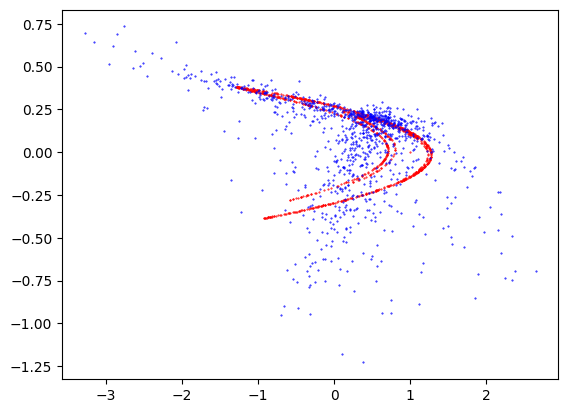

32/32 [==============================] - 0s 629us/step
2899 0.45100000500679016 0.6129999756813049


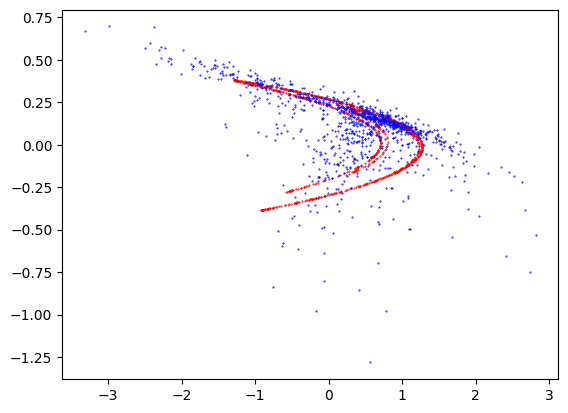

32/32 [==============================] - 0s 638us/step
3099 0.6439999938011169 0.550000011920929


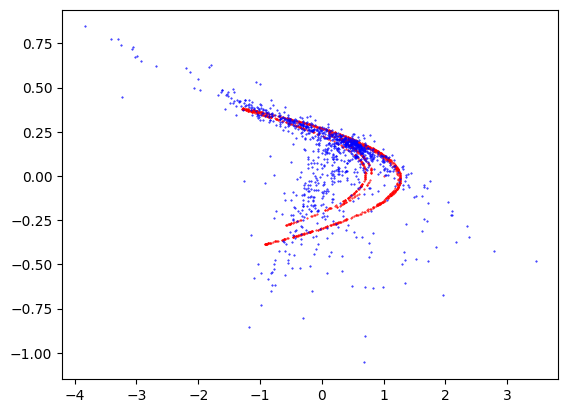

32/32 [==============================] - 0s 612us/step
3199 0.30300000309944153 0.7400000095367432


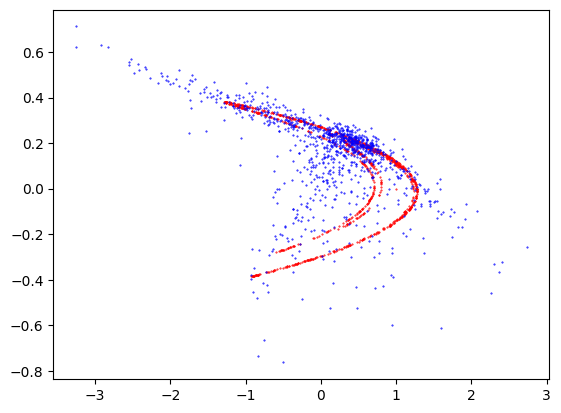

32/32 [==============================] - 0s 638us/step
3299 0.3009999990463257 0.871999979019165


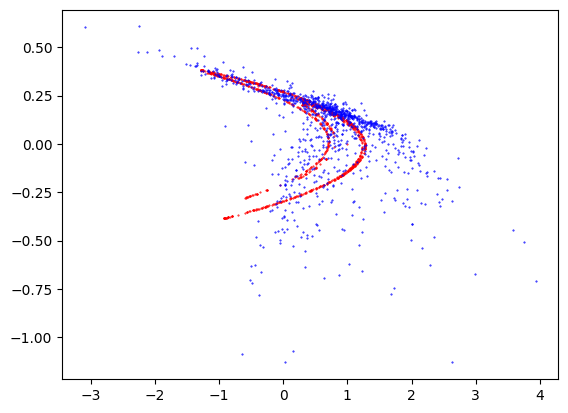

32/32 [==============================] - 0s 611us/step
3399 0.6359999775886536 0.3490000069141388


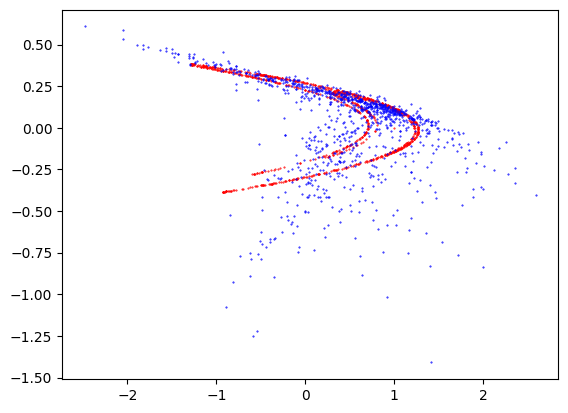

32/32 [==============================] - 0s 706us/step
3499 0.4309999942779541 0.6919999718666077


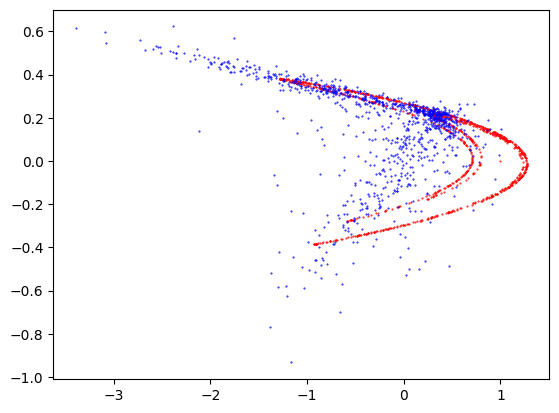

32/32 [==============================] - 0s 682us/step
3599 0.3050000071525574 0.8980000019073486


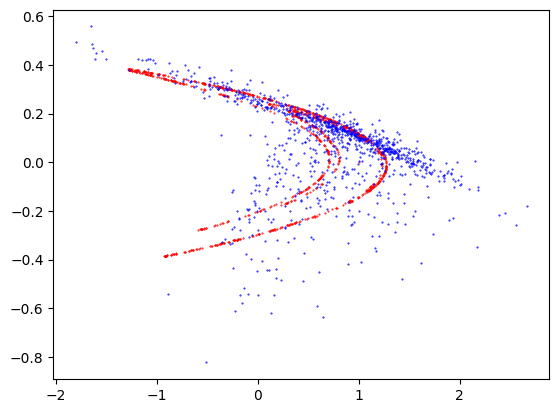

32/32 [==============================] - 0s 658us/step
3699 0.6179999709129333 0.4909999966621399


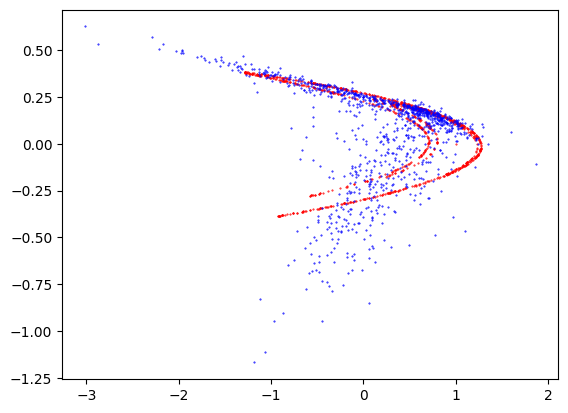

32/32 [==============================] - 0s 660us/step
3799 0.3269999921321869 0.718999981880188


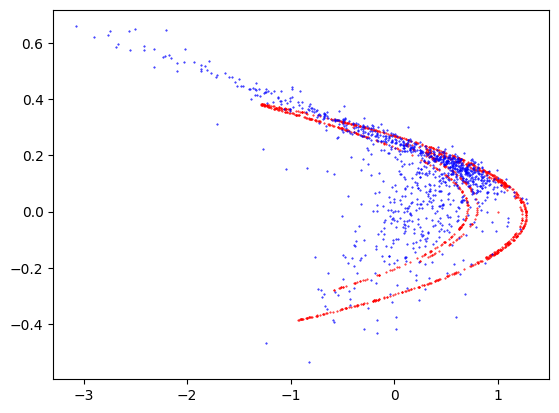

32/32 [==============================] - 0s 699us/step
3899 0.6169999837875366 0.2720000147819519


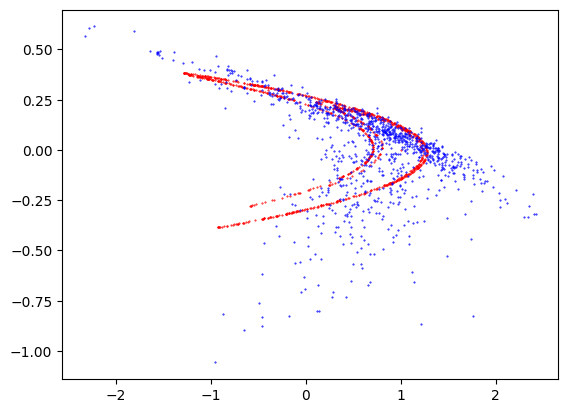

32/32 [==============================] - 0s 638us/step
3999 0.36899998784065247 0.5580000281333923


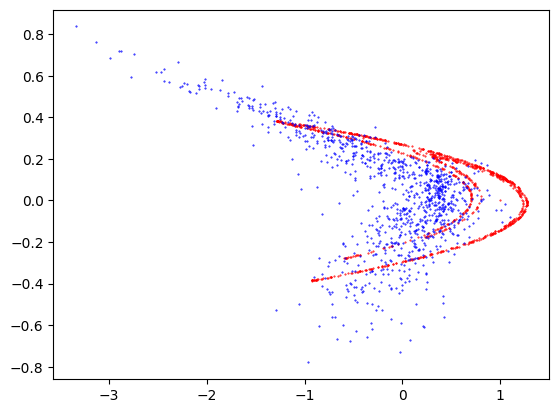

32/32 [==============================] - 0s 637us/step
4099 0.6439999938011169 0.46799999475479126


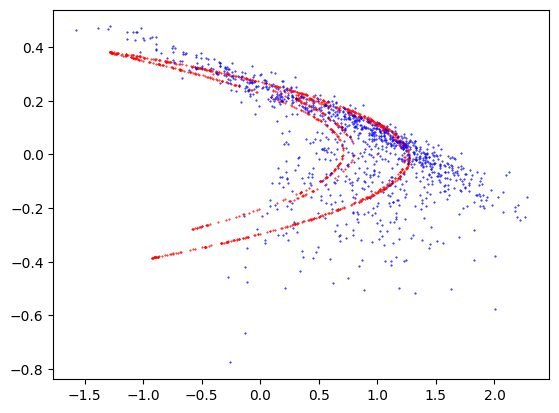

32/32 [==============================] - 0s 621us/step
4199 0.6039999723434448 0.6119999885559082


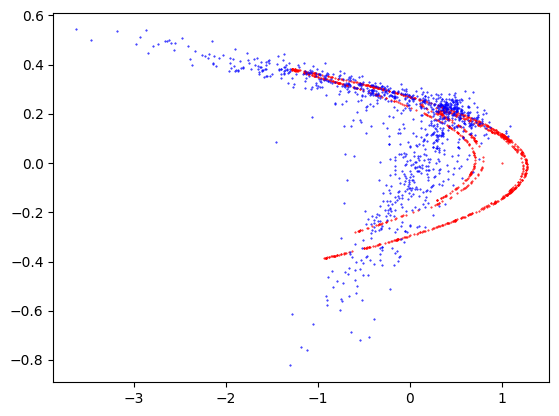

32/32 [==============================] - 0s 651us/step
4299 0.597000002861023 0.5669999718666077


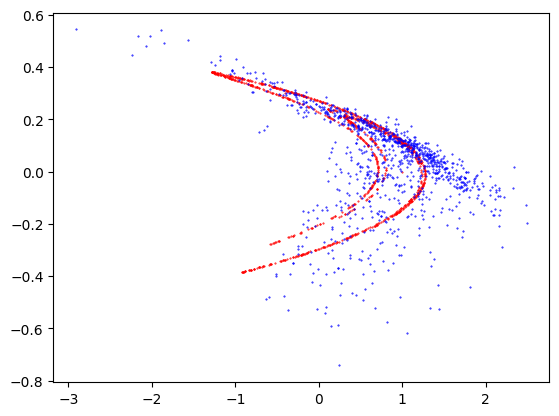

32/32 [==============================] - 0s 838us/step
4399 0.5929999947547913 0.6340000033378601


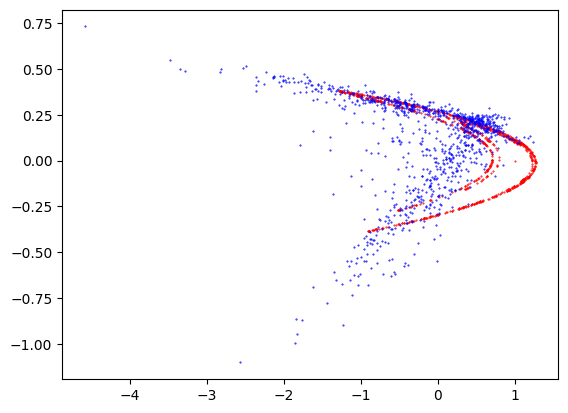

8/8 [==============================] - 0s 748us/step


IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



32/32 [==============================] - 0s 712us/step
5199 0.578000009059906 0.4729999899864197


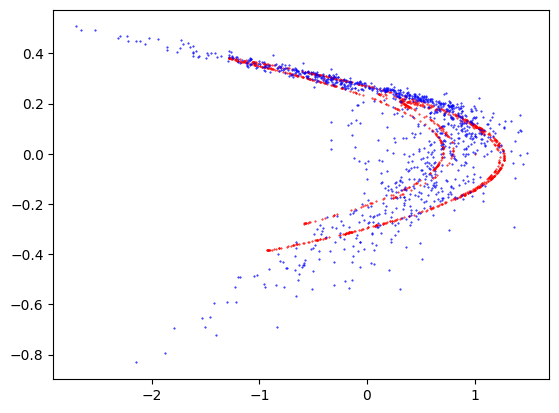

32/32 [==============================] - 0s 636us/step
5299 0.31700000166893005 0.7889999747276306


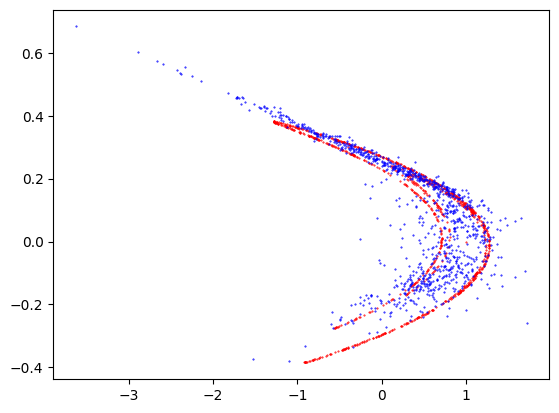

32/32 [==============================] - 0s 552us/step
5399 0.6359999775886536 0.3959999978542328


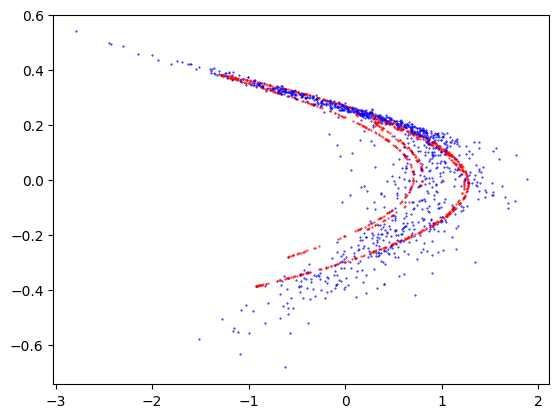

32/32 [==============================] - 0s 649us/step
5499 0.3009999990463257 0.753000020980835


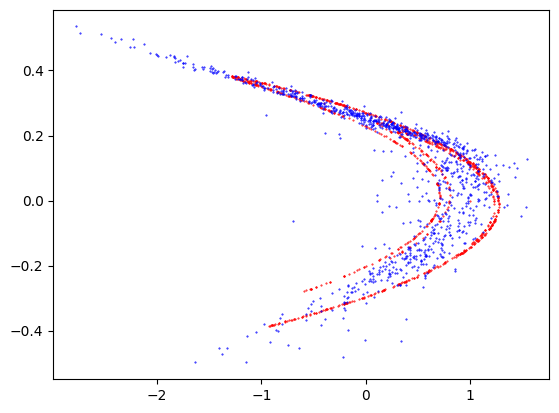

32/32 [==============================] - 0s 629us/step
5599 0.503000020980835 0.4819999933242798


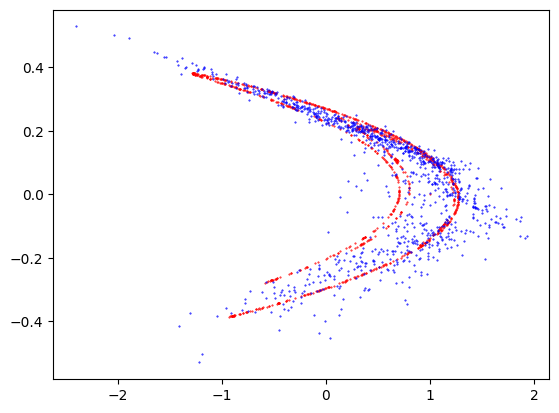

32/32 [==============================] - 0s 649us/step
5699 0.38100001215934753 0.6430000066757202


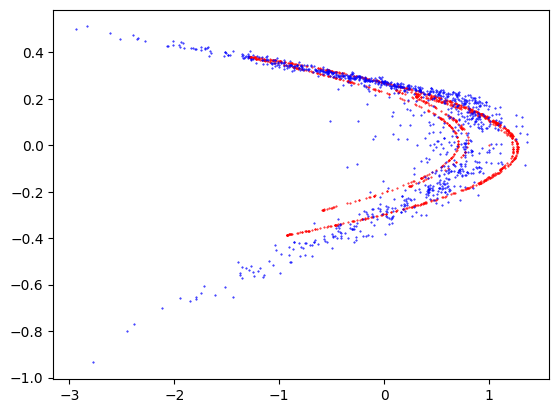

32/32 [==============================] - 0s 637us/step
5799 0.2639999985694885 0.8920000195503235


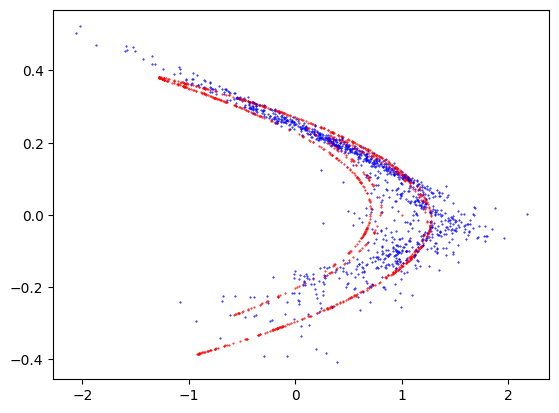

32/32 [==============================] - 0s 660us/step
5899 0.5379999876022339 0.5619999766349792


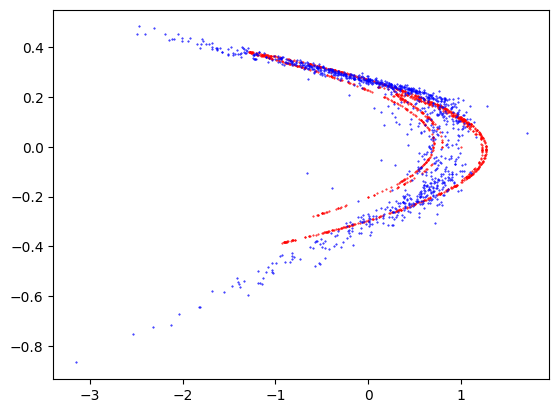

32/32 [==============================] - 0s 638us/step
5999 0.28600001335144043 0.7950000166893005


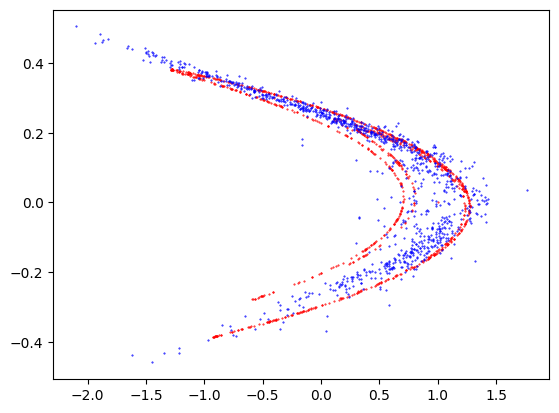

32/32 [==============================] - 0s 623us/step
6099 0.5329999923706055 0.36899998784065247


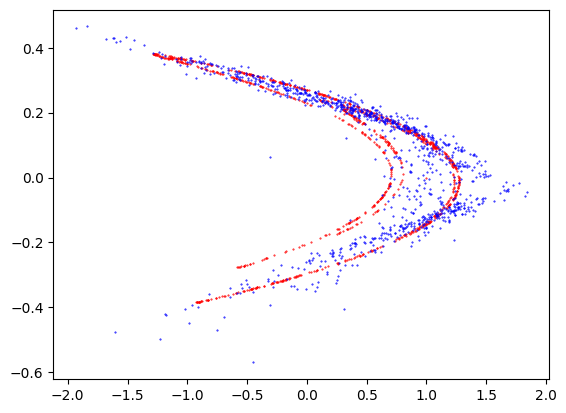

32/32 [==============================] - 0s 663us/step
6199 0.27900001406669617 0.7639999985694885


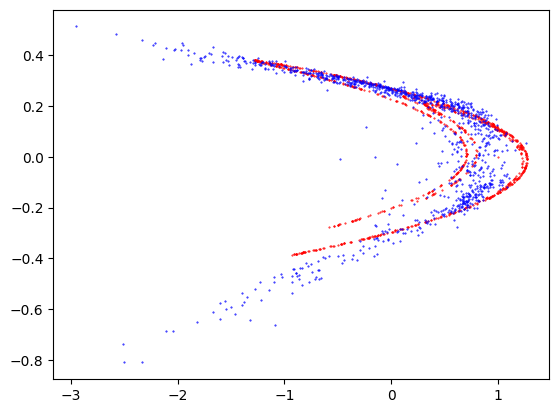

32/32 [==============================] - 0s 655us/step
6299 0.28700000047683716 0.843999981880188


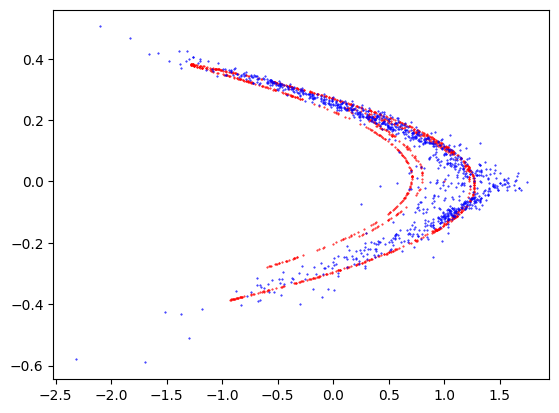

32/32 [==============================] - 0s 613us/step
6399 0.5009999871253967 0.48899999260902405


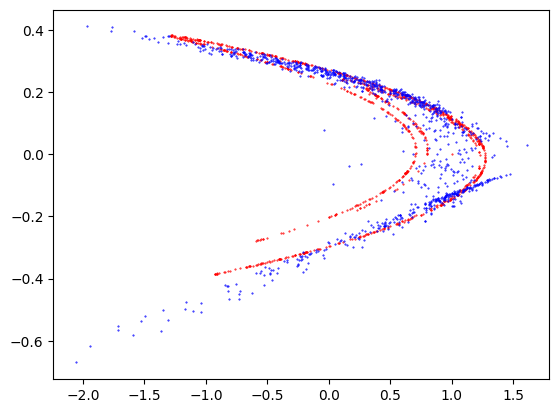

32/32 [==============================] - 0s 556us/step
6499 0.28200000524520874 0.7739999890327454


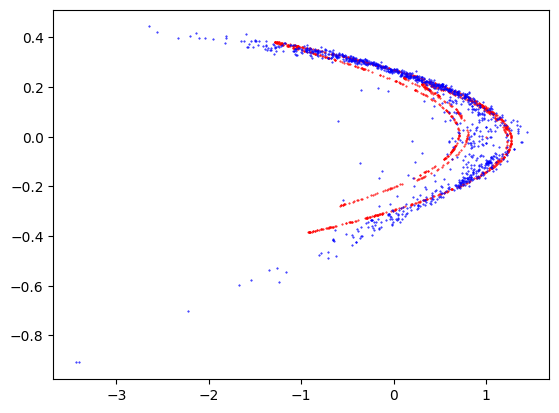

32/32 [==============================] - 0s 620us/step
6599 0.28999999165534973 0.8090000152587891


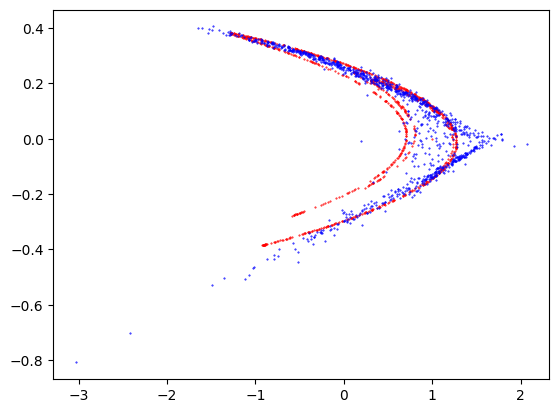

32/32 [==============================] - 0s 606us/step
6699 0.3149999976158142 0.7509999871253967


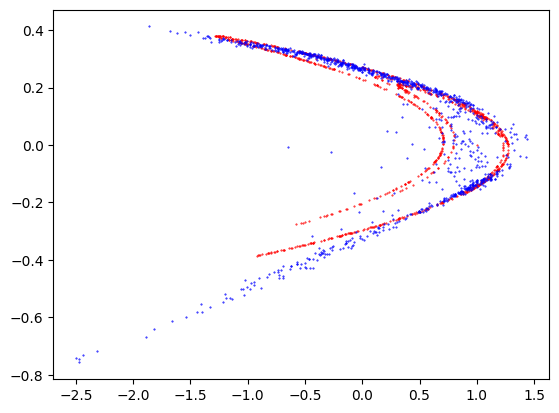

32/32 [==============================] - 0s 657us/step
6799 0.2770000100135803 0.7760000228881836


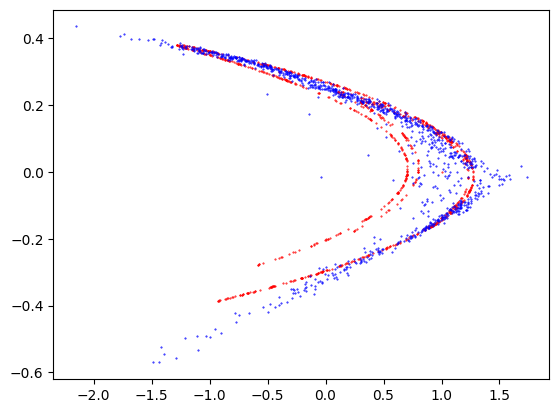

32/32 [==============================] - 0s 636us/step
6899 0.4519999921321869 0.6679999828338623


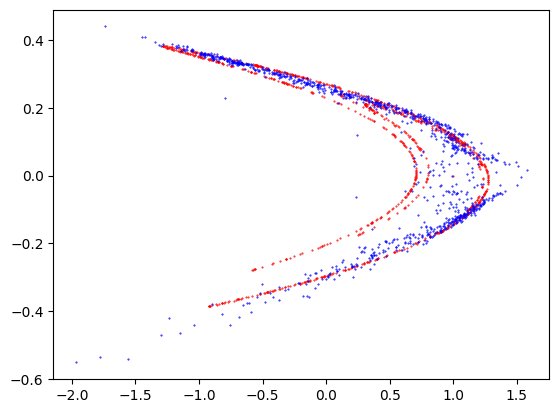

32/32 [==============================] - 0s 672us/step
6999 0.30300000309944153 0.718999981880188


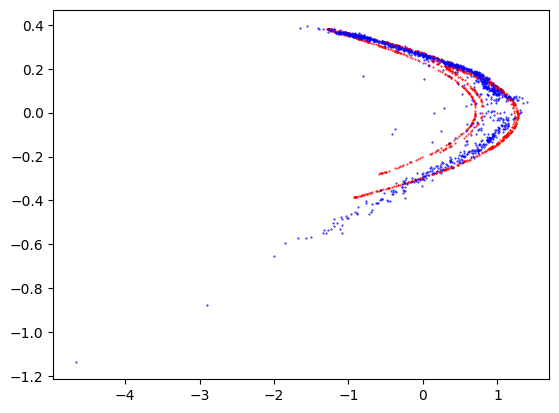

32/32 [==============================] - 0s 650us/step
7099 0.328000009059906 0.7139999866485596


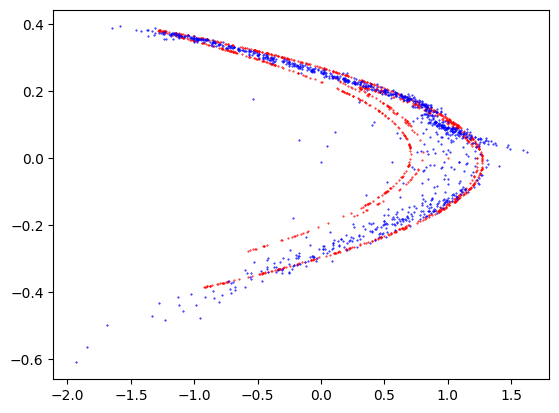

32/32 [==============================] - 0s 650us/step
7199 0.6200000047683716 0.3889999985694885


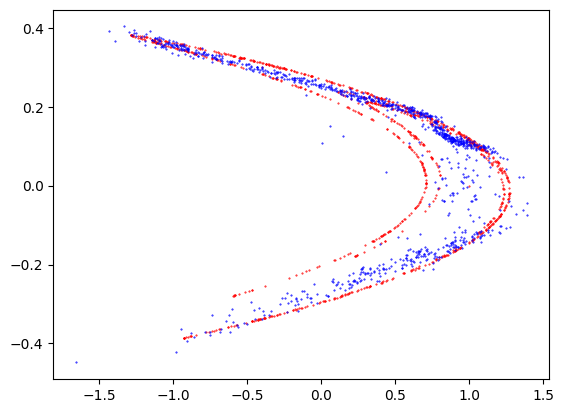

32/32 [==============================] - 0s 665us/step
7299 0.5210000276565552 0.47099998593330383


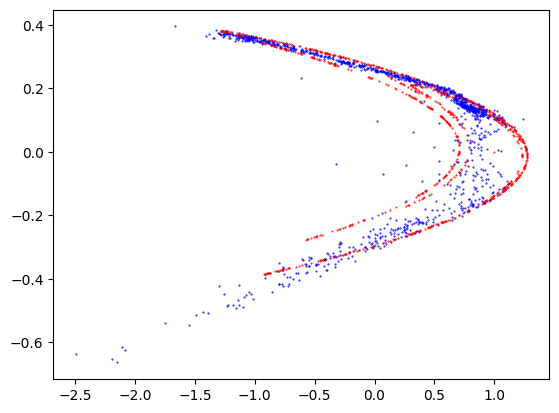

32/32 [==============================] - 0s 616us/step
7399 0.3580000102519989 0.6940000057220459


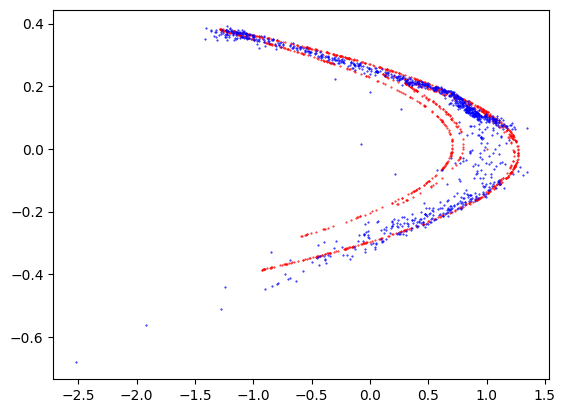

32/32 [==============================] - 0s 601us/step
7499 0.6700000166893005 0.32100000977516174


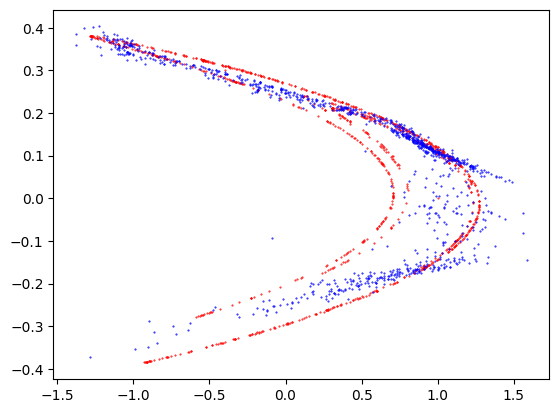

32/32 [==============================] - 0s 641us/step
7599 0.621999979019165 0.46399998664855957


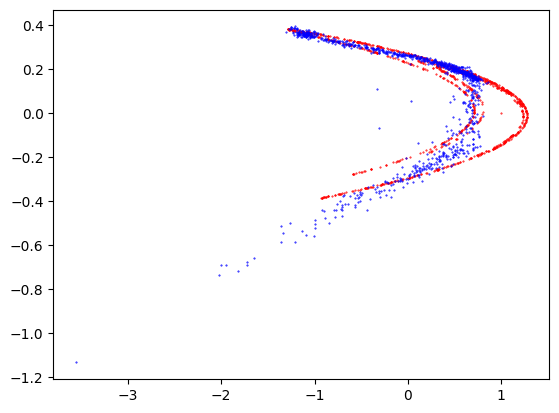

32/32 [==============================] - 0s 616us/step
7699 0.3109999895095825 0.6790000200271606


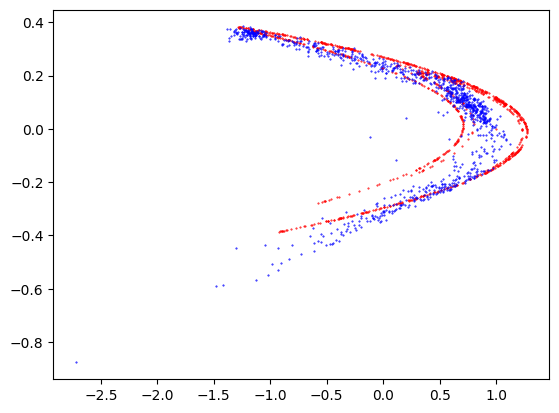

32/32 [==============================] - 0s 676us/step
7799 0.6269999742507935 0.40299999713897705


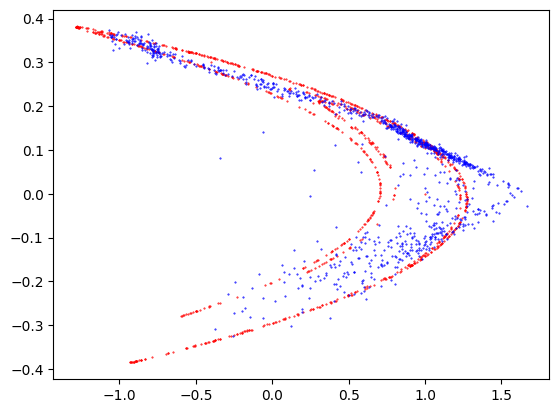

32/32 [==============================] - 0s 619us/step
7899 0.6510000228881836 0.40400001406669617


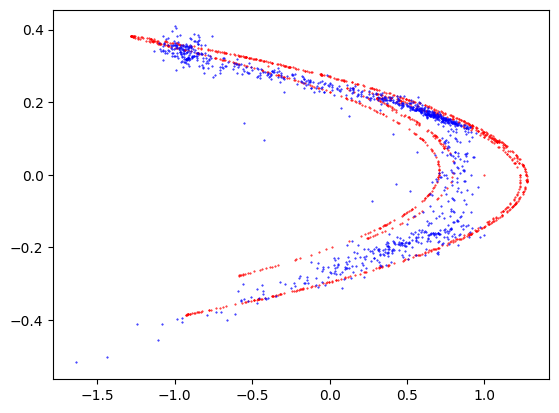

32/32 [==============================] - 0s 659us/step
7999 0.3840000033378601 0.6029999852180481


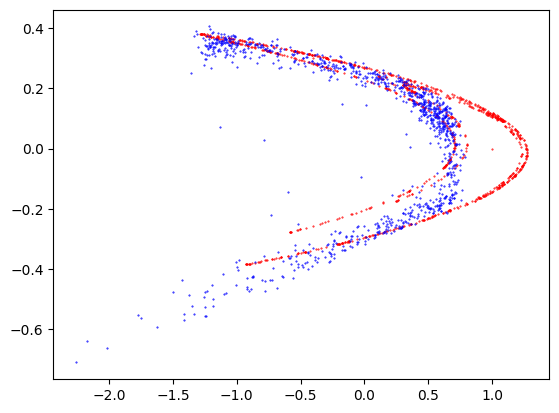

32/32 [==============================] - 0s 643us/step
8099 0.41999998688697815 0.7300000190734863


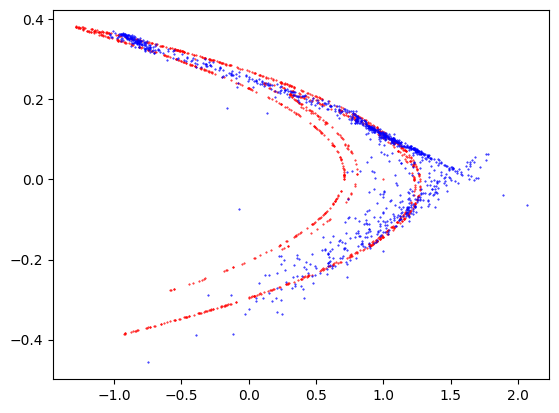

32/32 [==============================] - 0s 702us/step
8199 0.6389999985694885 0.3930000066757202


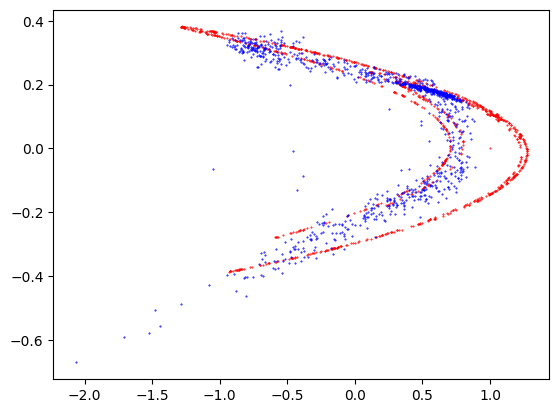

32/32 [==============================] - 0s 670us/step
8299 0.39100000262260437 0.6759999990463257


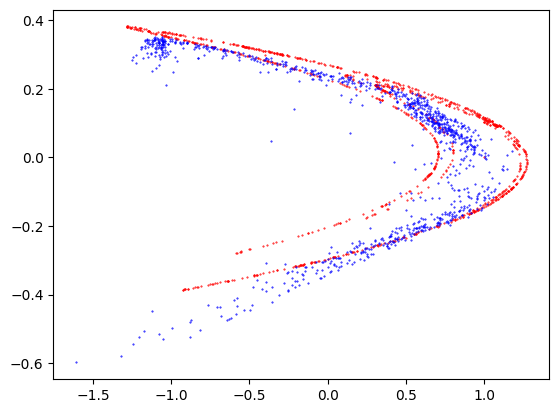

32/32 [==============================] - 0s 628us/step
8399 0.8149999976158142 0.13699999451637268


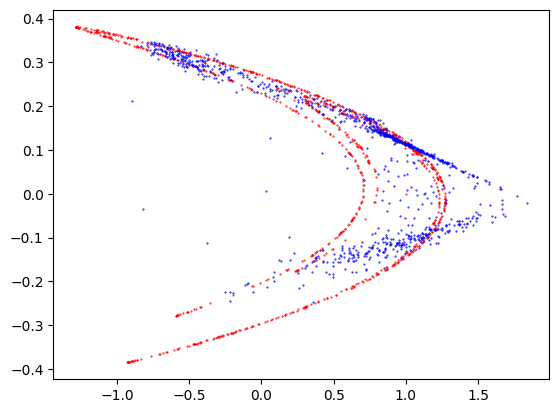

32/32 [==============================] - 0s 643us/step
8499 0.5429999828338623 0.6000000238418579


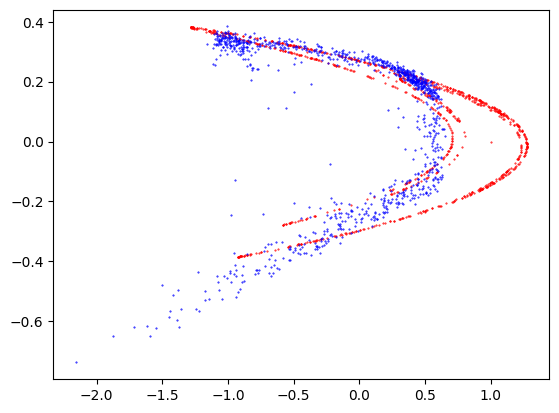

32/32 [==============================] - 0s 624us/step
8599 0.3449999988079071 0.7490000128746033


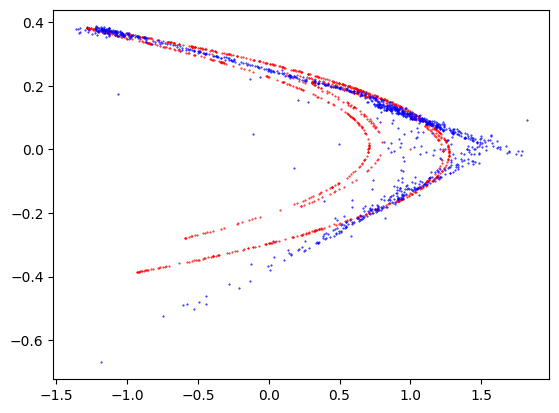

32/32 [==============================] - 0s 666us/step
8699 0.6359999775886536 0.41200000047683716


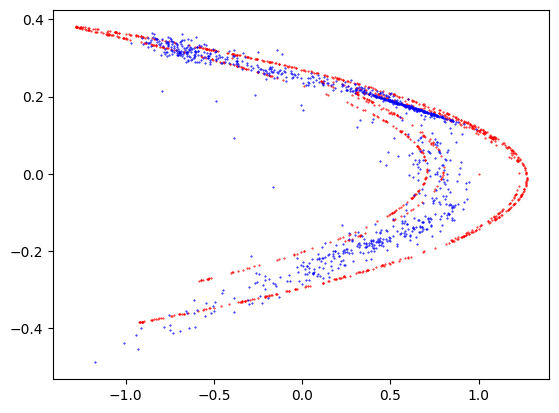

32/32 [==============================] - 0s 673us/step
8799 0.35199999809265137 0.6639999747276306


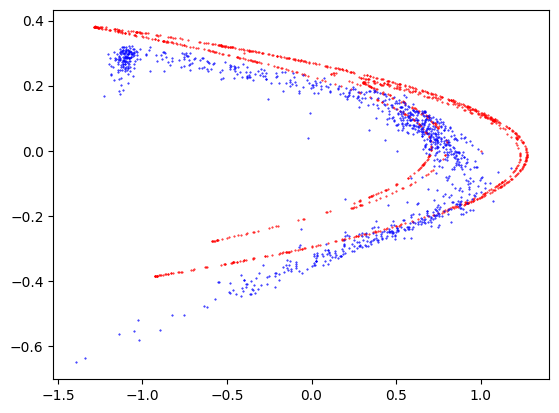

32/32 [==============================] - 0s 636us/step
8899 0.6399999856948853 0.33000001311302185


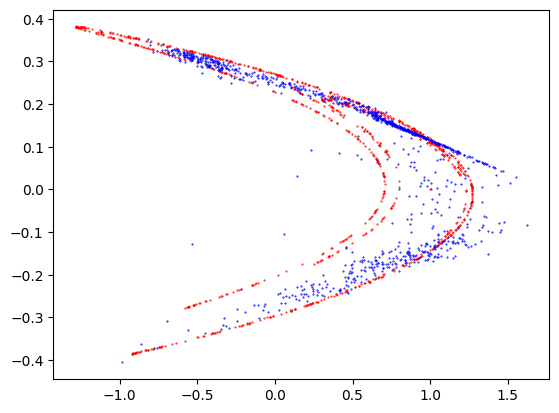

32/32 [==============================] - 0s 679us/step
8999 0.23100000619888306 0.7310000061988831


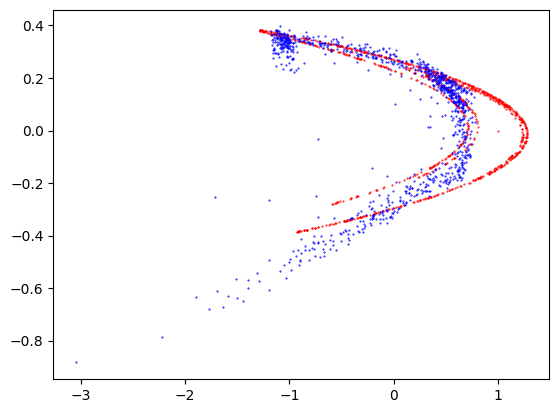

32/32 [==============================] - 0s 643us/step
9099 0.48899999260902405 0.5720000267028809


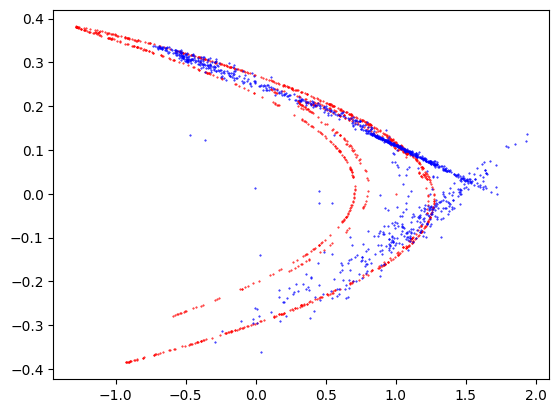

32/32 [==============================] - 0s 660us/step
9199 0.6069999933242798 0.527999997138977


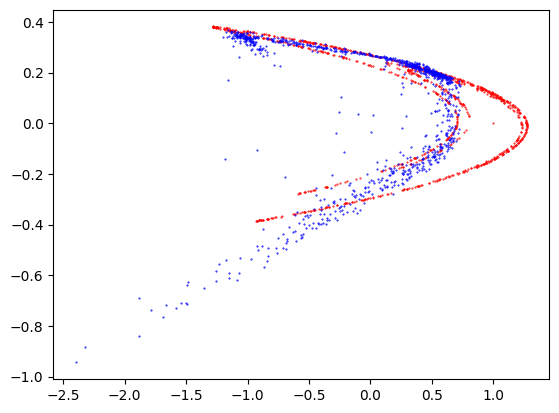

32/32 [==============================] - 0s 564us/step
9299 0.36899998784065247 0.7459999918937683


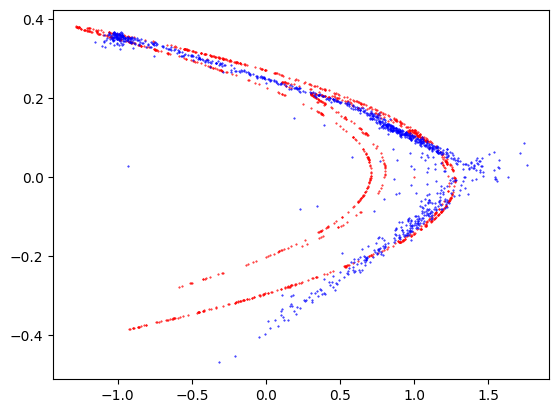

32/32 [==============================] - 0s 553us/step
9399 0.6259999871253967 0.4410000145435333


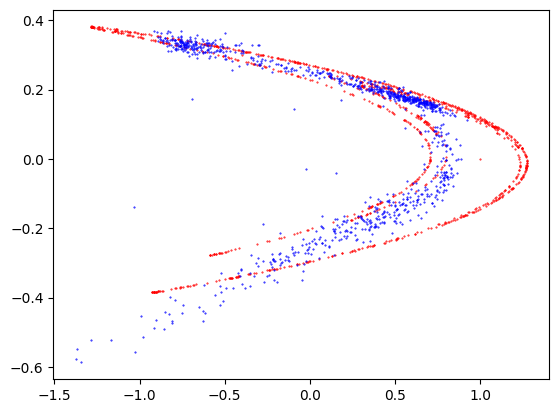

32/32 [==============================] - 0s 545us/step
9499 0.3529999852180481 0.6959999799728394


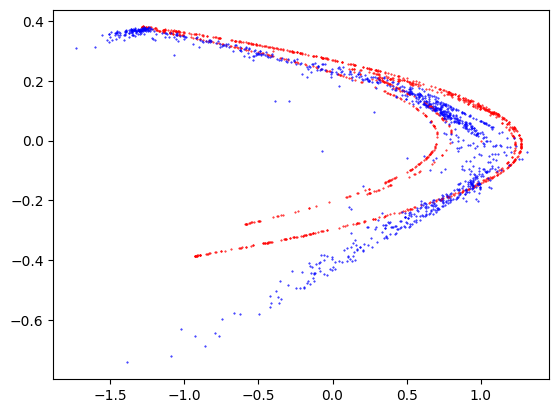

32/32 [==============================] - 0s 571us/step
9599 0.6330000162124634 0.38600000739097595


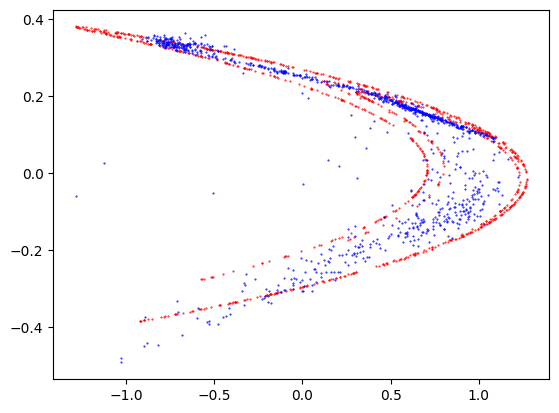

32/32 [==============================] - 0s 568us/step
9699 0.3659999966621399 0.6299999952316284


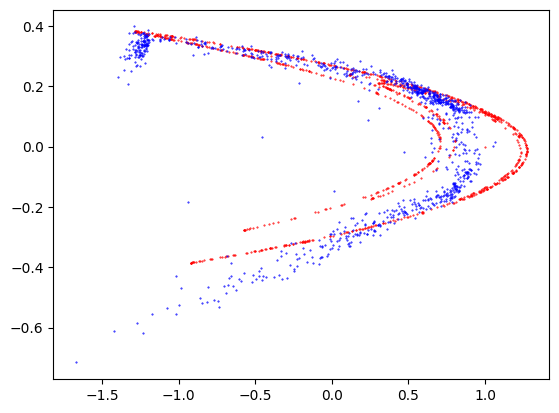

32/32 [==============================] - 0s 540us/step
9799 0.7599999904632568 0.3230000138282776


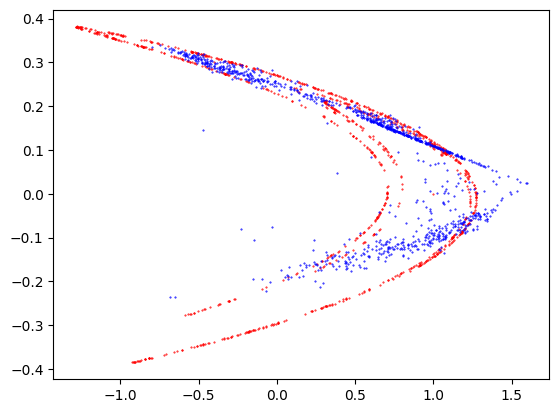

32/32 [==============================] - 0s 546us/step
9899 0.3709999918937683 0.5669999718666077


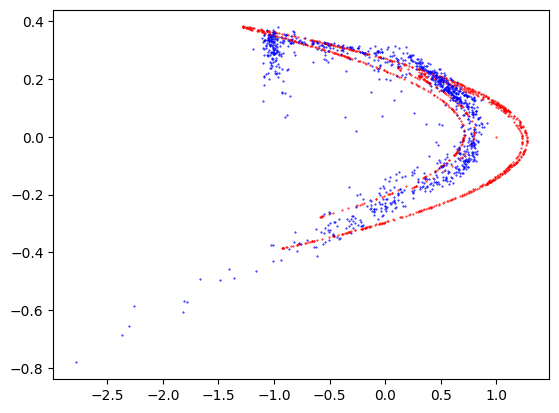

32/32 [==============================] - 0s 538us/step
9999 0.6629999876022339 0.23000000417232513


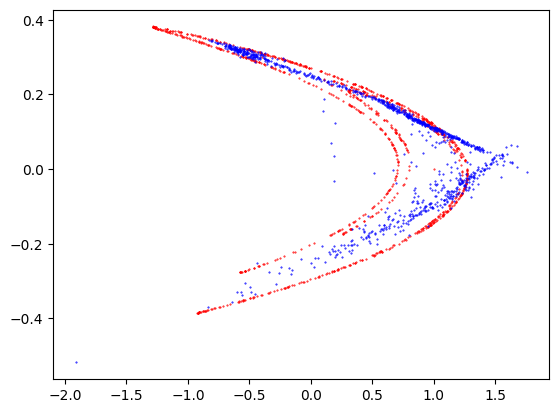

32/32 [==============================] - 0s 575us/step
10099 0.32100000977516174 0.7110000252723694


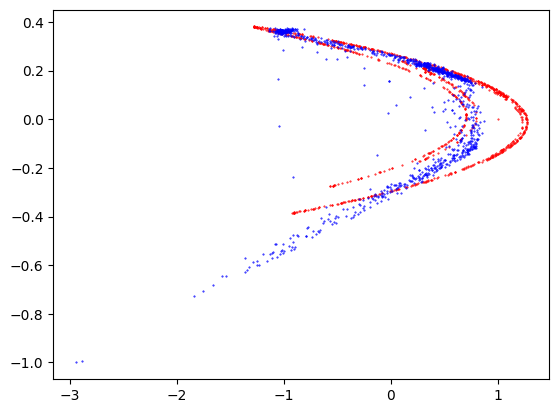

32/32 [==============================] - 0s 538us/step
10199 0.4490000009536743 0.621999979019165


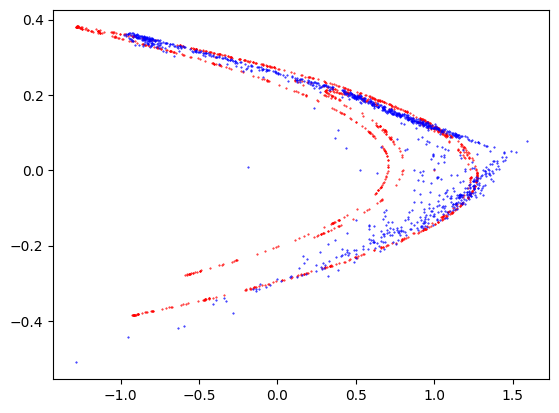

32/32 [==============================] - 0s 535us/step
10299 0.4749999940395355 0.4959999918937683


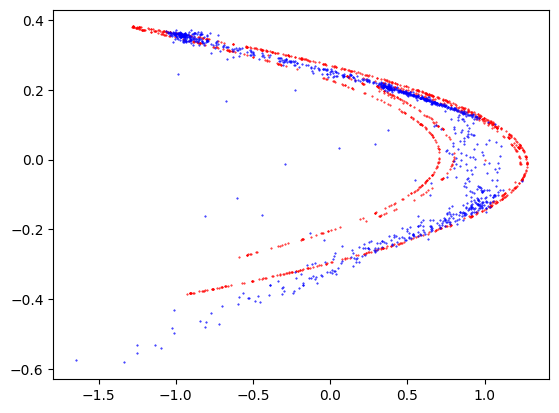

32/32 [==============================] - 0s 536us/step
10399 0.32899999618530273 0.609000027179718


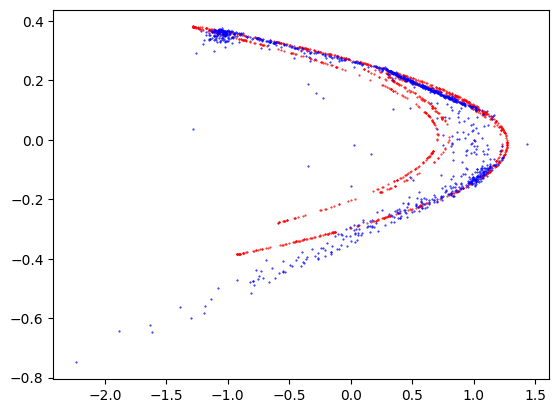

32/32 [==============================] - 0s 549us/step
10499 0.33799999952316284 0.6769999861717224


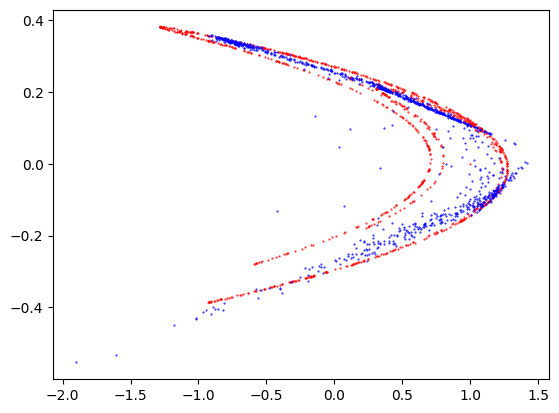

32/32 [==============================] - 0s 565us/step
10599 0.3630000054836273 0.6309999823570251


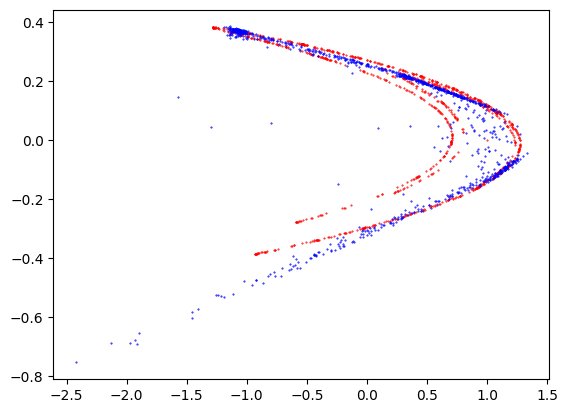

32/32 [==============================] - 0s 541us/step
10699 0.28200000524520874 0.6940000057220459


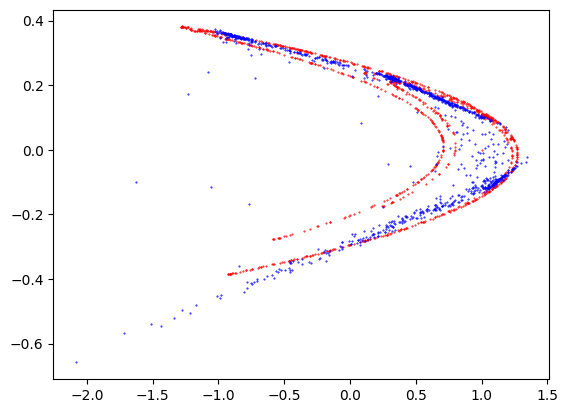

32/32 [==============================] - 0s 536us/step
10799 0.1940000057220459 0.8100000023841858


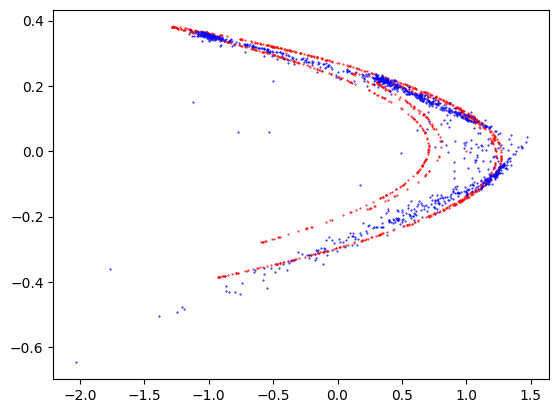

32/32 [==============================] - 0s 539us/step
10899 0.1809999942779541 0.8180000185966492


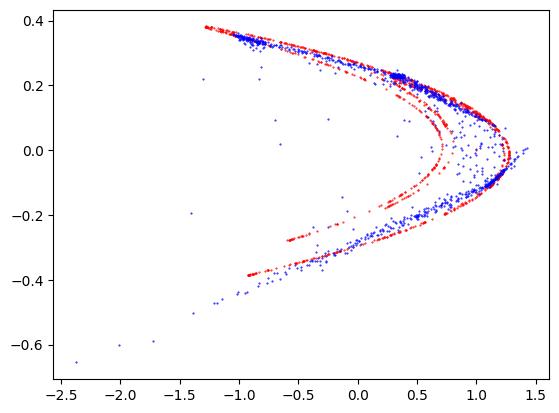

32/32 [==============================] - 0s 557us/step
10999 0.0949999988079071 0.9369999766349792


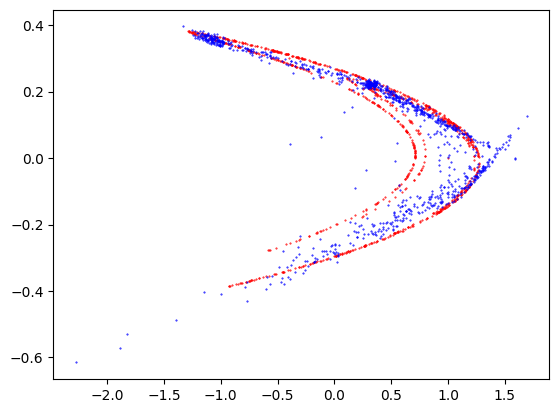

32/32 [==============================] - 0s 549us/step
11099 0.11400000005960464 0.9210000038146973


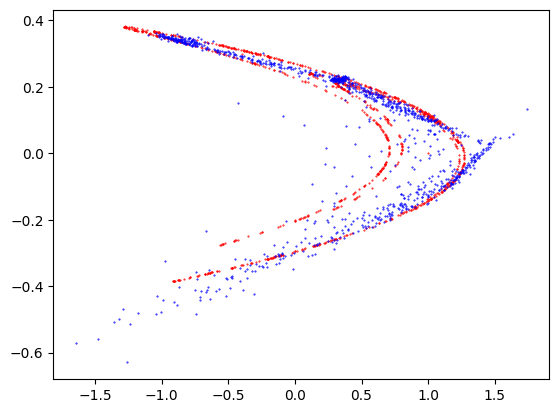

32/32 [==============================] - 0s 550us/step
11199 0.4129999876022339 0.6420000195503235


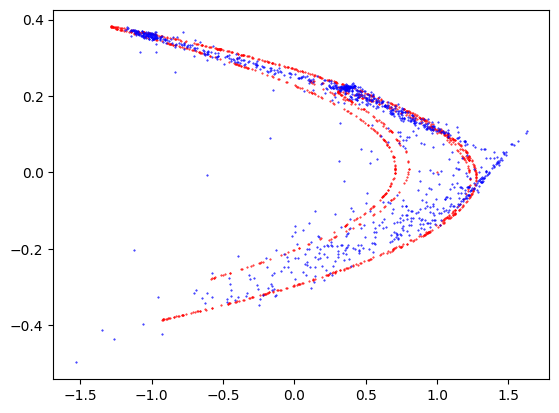

32/32 [==============================] - 0s 544us/step
11299 0.20800000429153442 0.7900000214576721


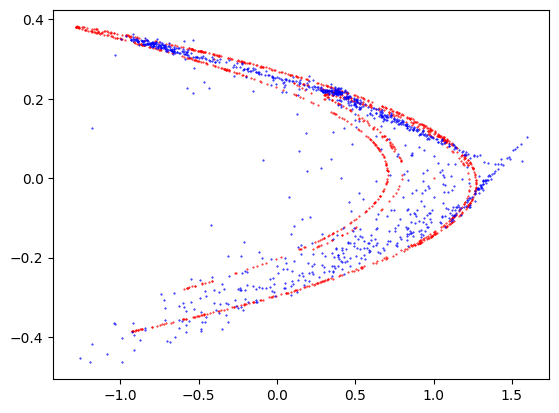

32/32 [==============================] - 0s 557us/step
11399 0.37400001287460327 0.5989999771118164


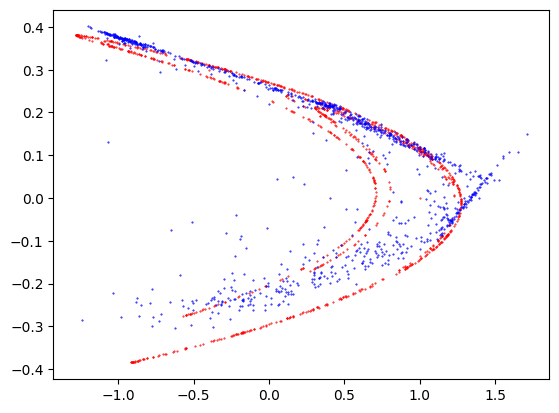

32/32 [==============================] - 0s 541us/step
11499 0.3930000066757202 0.5490000247955322


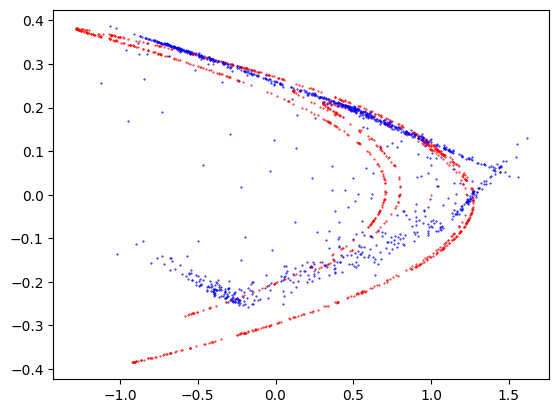

32/32 [==============================] - 0s 557us/step
11599 0.5680000185966492 0.38100001215934753


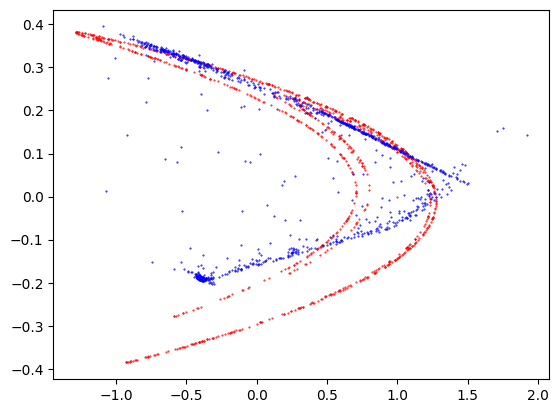

32/32 [==============================] - 0s 561us/step
11699 0.6819999814033508 0.23199999332427979


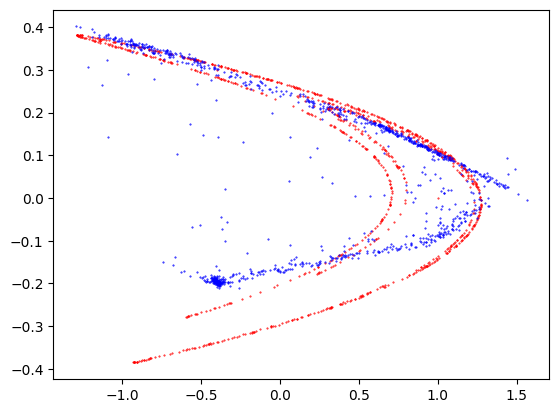

32/32 [==============================] - 0s 548us/step
11799 0.7239999771118164 0.34700000286102295


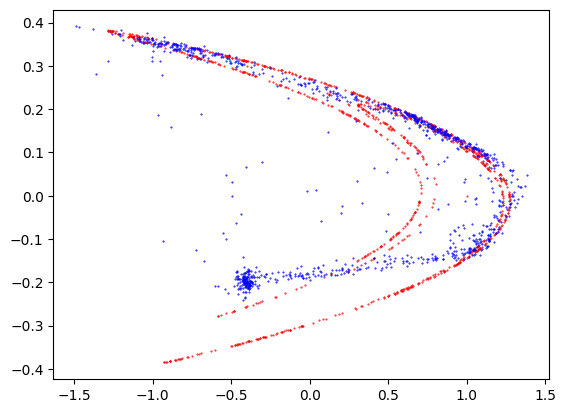

32/32 [==============================] - 0s 543us/step
11899 0.492000013589859 0.609000027179718


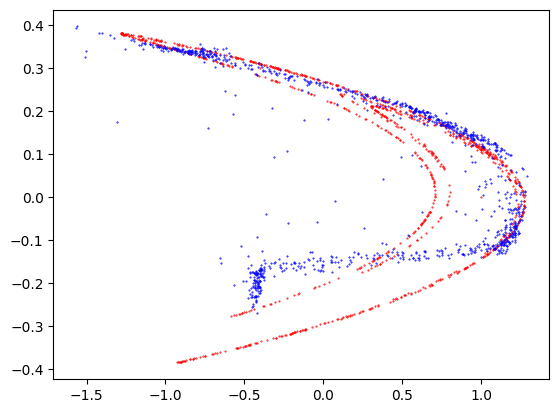

32/32 [==============================] - 0s 541us/step
11999 0.5669999718666077 0.44999998807907104


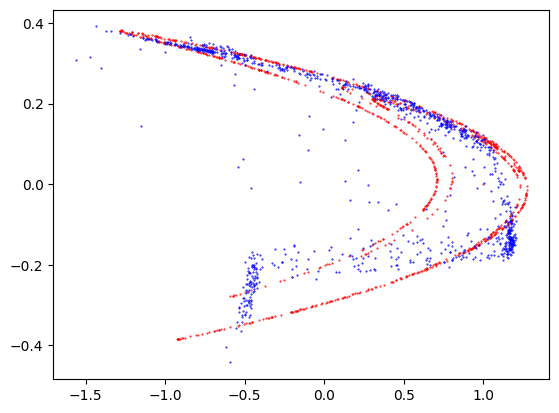

32/32 [==============================] - 0s 534us/step
12099 0.7170000076293945 0.21899999678134918


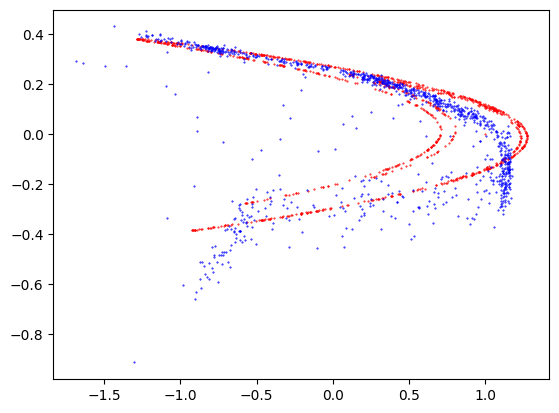

32/32 [==============================] - 0s 536us/step
12199 0.6769999861717224 0.27300000190734863


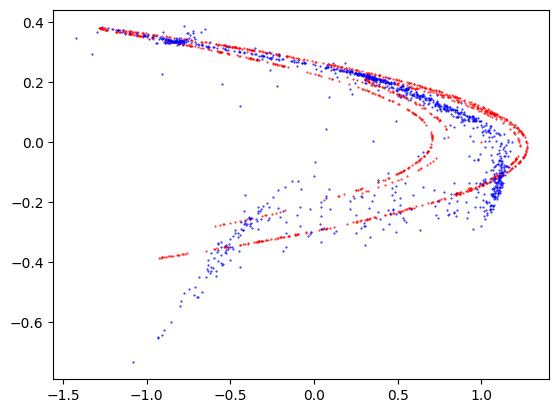

32/32 [==============================] - 0s 535us/step
12299 0.3959999978542328 0.44200000166893005


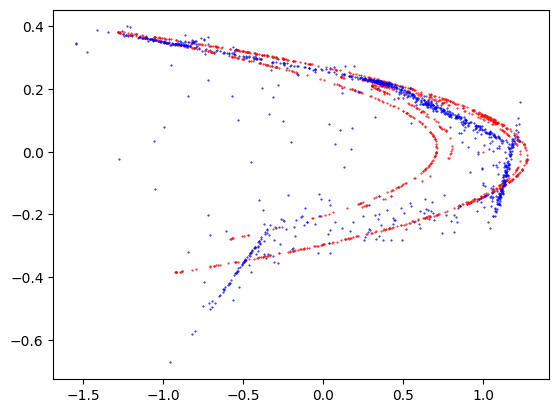

32/32 [==============================] - 0s 569us/step
12399 0.20999999344348907 0.718999981880188


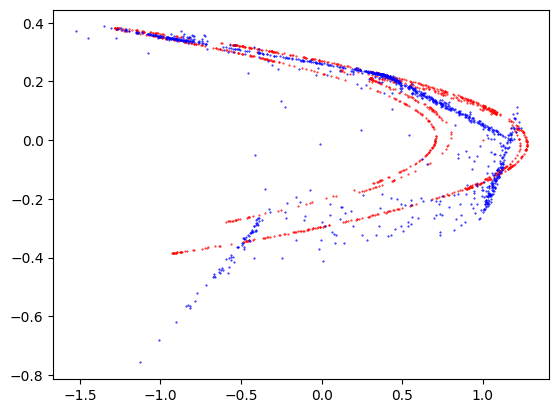

32/32 [==============================] - 0s 552us/step
12499 0.11599999666213989 0.8320000171661377


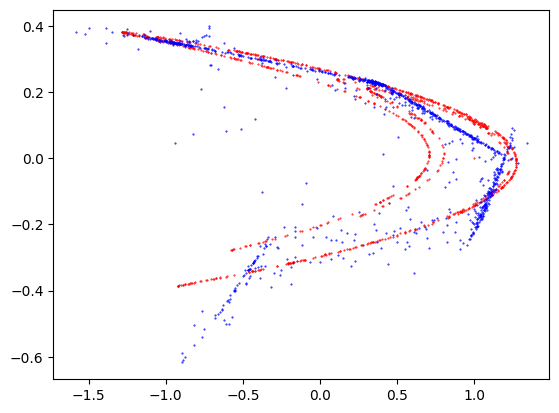

32/32 [==============================] - 0s 538us/step
12599 0.1340000033378601 0.796999990940094


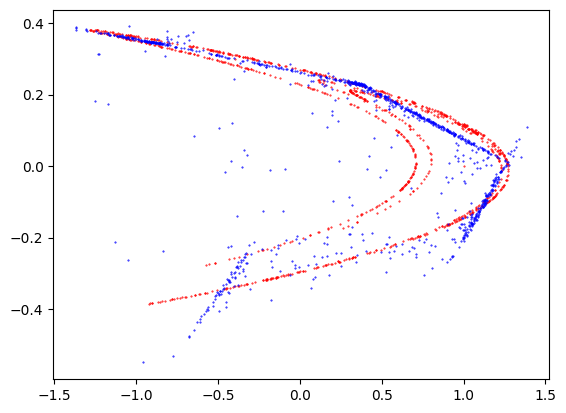

32/32 [==============================] - 0s 557us/step
12699 0.05700000002980232 0.9470000267028809


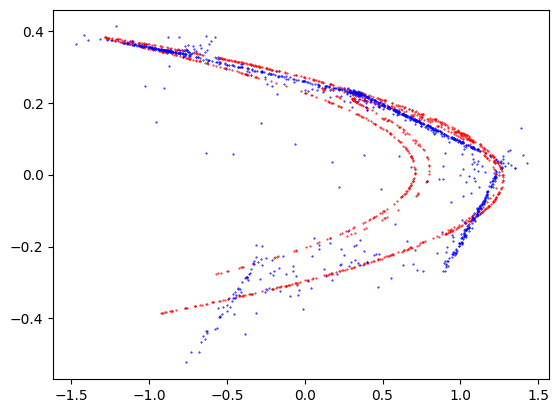

32/32 [==============================] - 0s 566us/step
12799 0.07999999821186066 0.8410000205039978


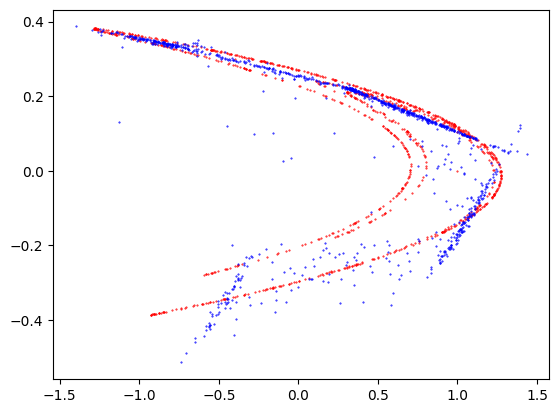

32/32 [==============================] - 0s 538us/step
12899 0.1379999965429306 0.7639999985694885


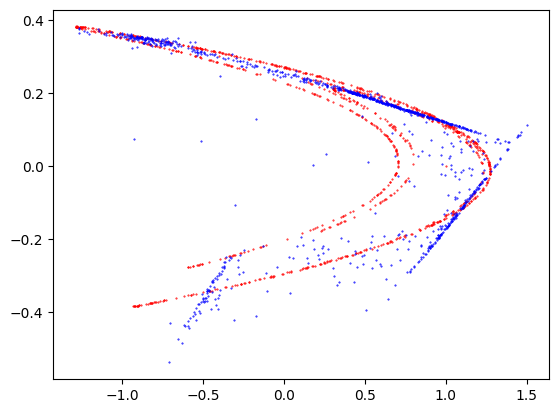

32/32 [==============================] - 0s 565us/step
12999 0.35100001096725464 0.47999998927116394


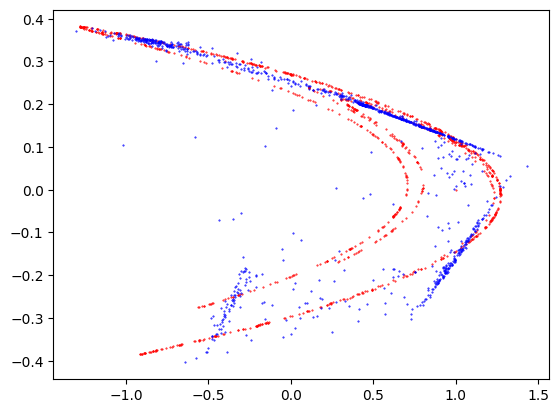

32/32 [==============================] - 0s 554us/step
13099 0.7279999852180481 0.17399999499320984


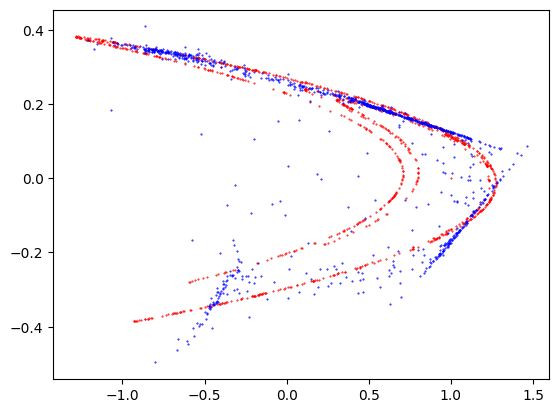

32/32 [==============================] - 0s 555us/step
13199 0.5329999923706055 0.41999998688697815


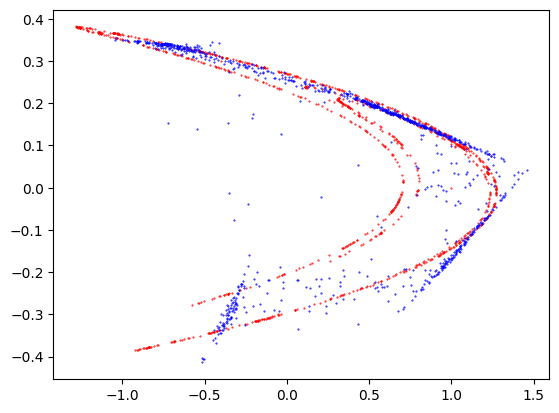

32/32 [==============================] - 0s 533us/step
13299 0.36800000071525574 0.5820000171661377


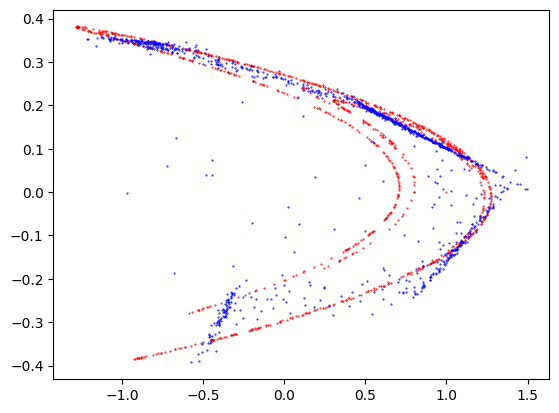

32/32 [==============================] - 0s 546us/step
13399 0.38100001215934753 0.5320000052452087


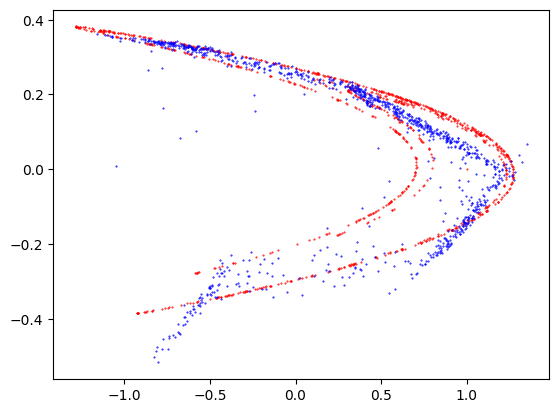

32/32 [==============================] - 0s 539us/step
13499 0.27000001072883606 0.6259999871253967


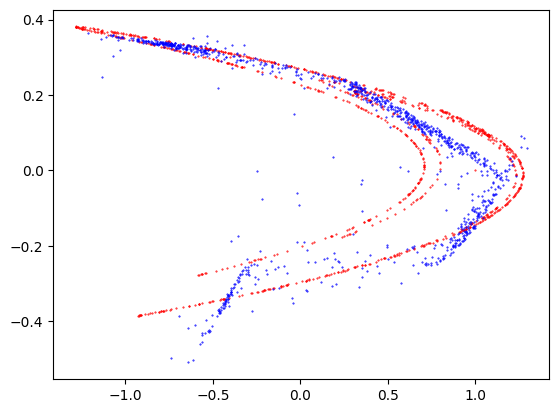

32/32 [==============================] - 0s 549us/step
13599 0.625 0.24699999392032623


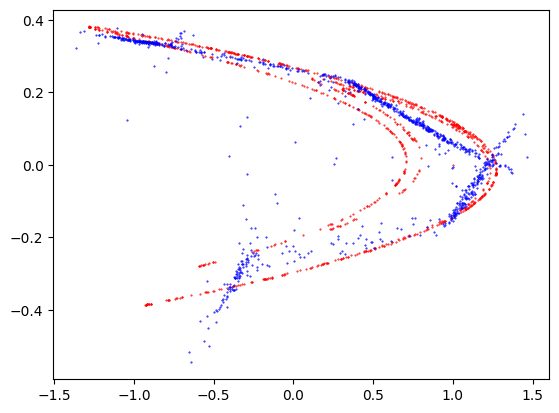

32/32 [==============================] - 0s 565us/step
13699 0.7570000290870667 0.17299999296665192


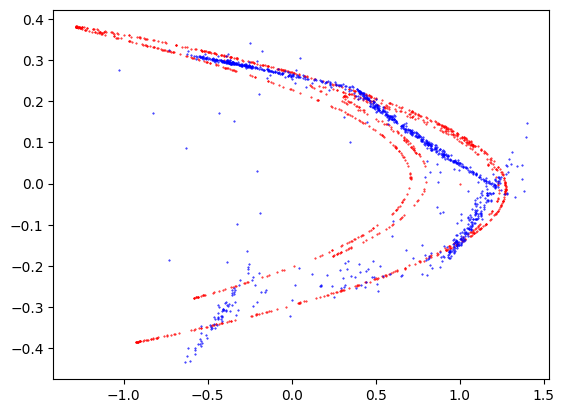

32/32 [==============================] - 0s 553us/step
13799 0.19699999690055847 0.6850000023841858


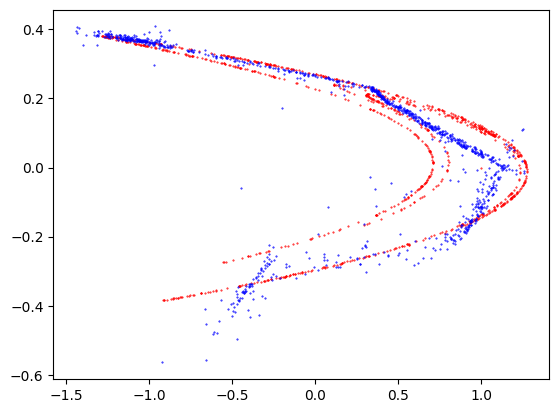

32/32 [==============================] - 0s 558us/step
13899 0.6480000019073486 0.1979999989271164


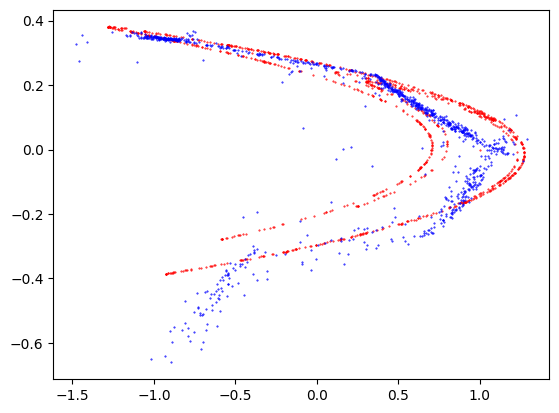

32/32 [==============================] - 0s 542us/step
13999 0.5139999985694885 0.382999986410141


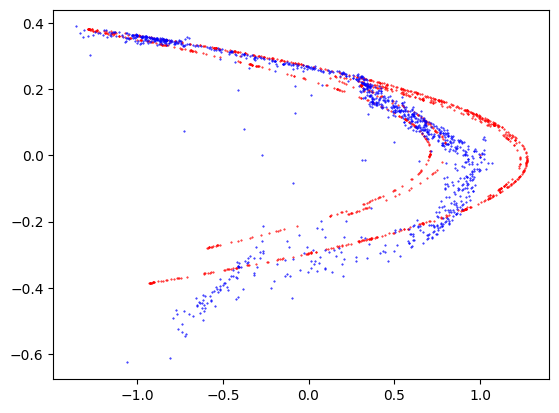

32/32 [==============================] - 0s 576us/step
14099 0.5830000042915344 0.42399999499320984


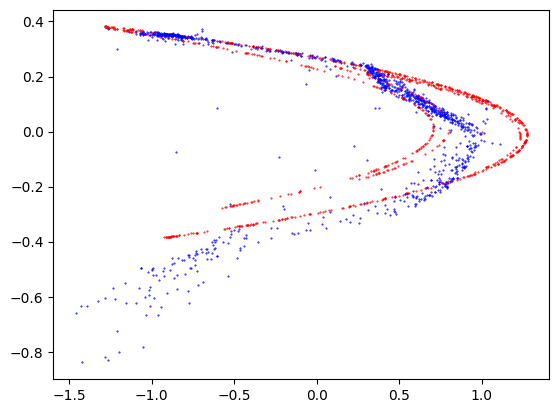

32/32 [==============================] - 0s 545us/step
14199 0.6060000061988831 0.3490000069141388


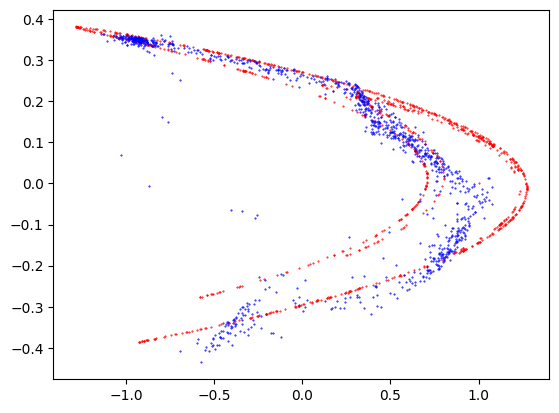

32/32 [==============================] - 0s 533us/step
14299 0.5479999780654907 0.49000000953674316


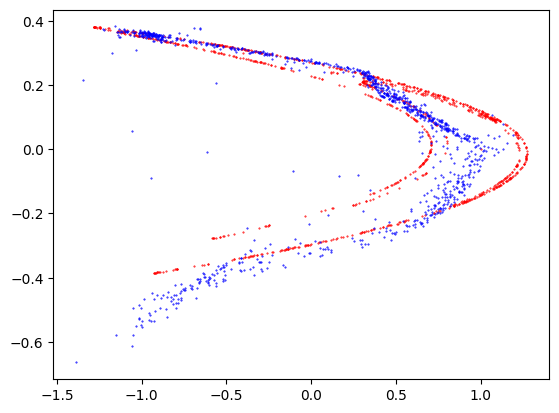

32/32 [==============================] - 0s 556us/step
14399 0.7419999837875366 0.20399999618530273


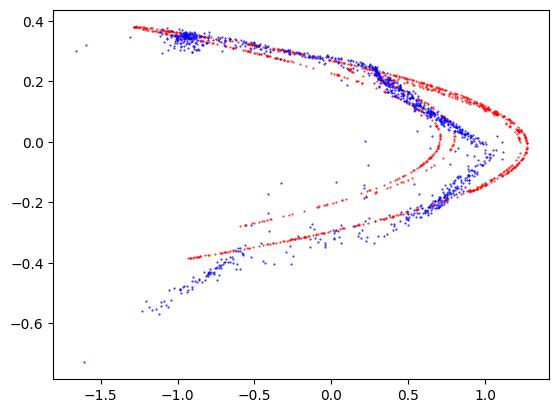

32/32 [==============================] - 0s 541us/step
14499 0.12800000607967377 0.7749999761581421


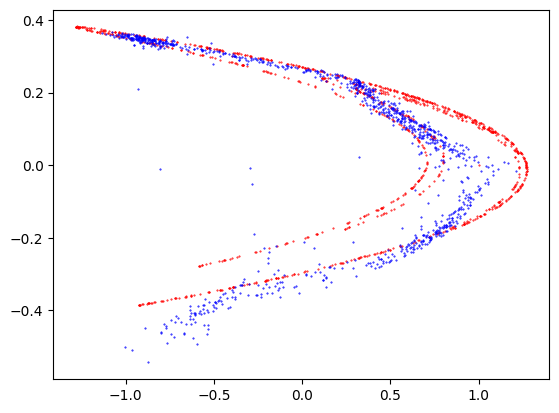

32/32 [==============================] - 0s 579us/step
14599 0.27300000190734863 0.7459999918937683


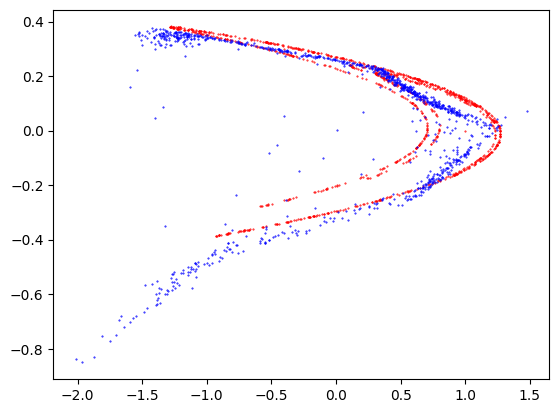

32/32 [==============================] - 0s 545us/step
14699 0.14499999582767487 0.8529999852180481


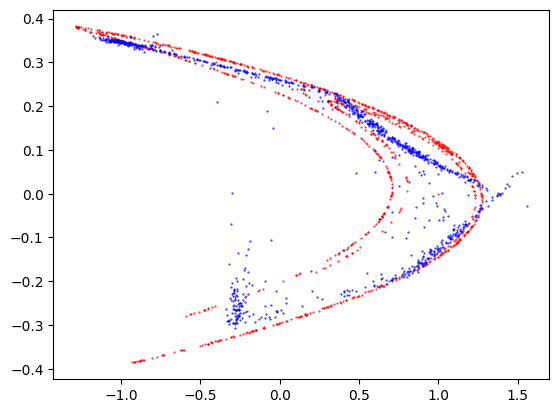

32/32 [==============================] - 0s 549us/step
14799 0.8040000200271606 0.19200000166893005


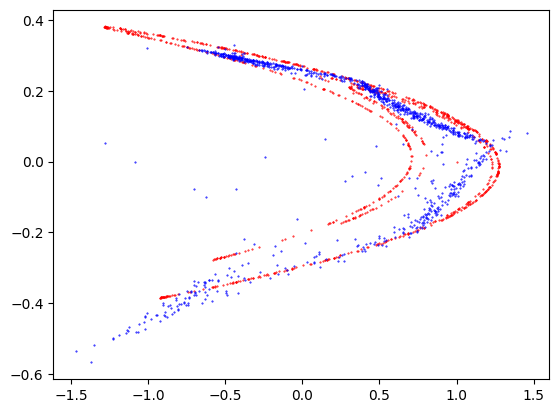

32/32 [==============================] - 0s 567us/step
14899 0.2709999978542328 0.6690000295639038


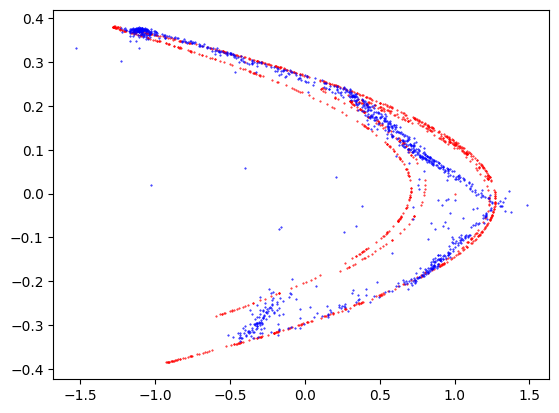

32/32 [==============================] - 0s 539us/step
14999 0.39800000190734863 0.6190000176429749


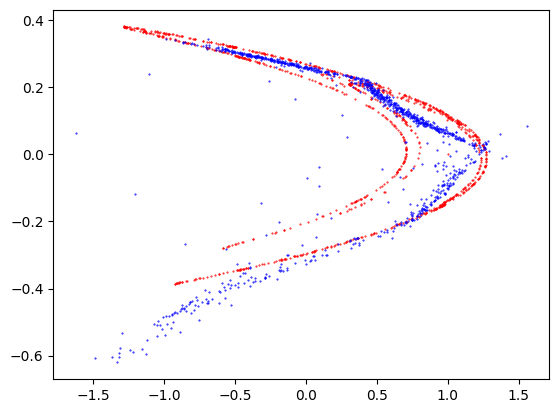

32/32 [==============================] - 0s 534us/step
15099 0.2849999964237213 0.6729999780654907


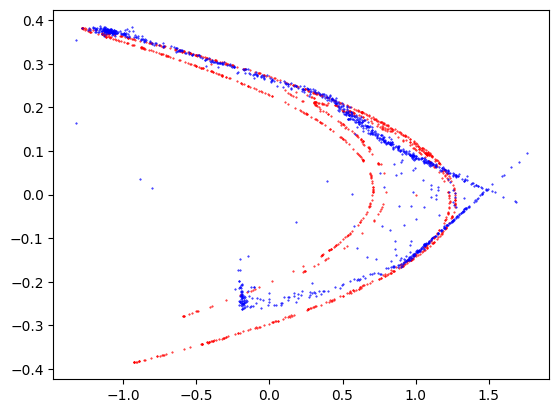

32/32 [==============================] - 0s 540us/step
15199 0.6179999709129333 0.37400001287460327


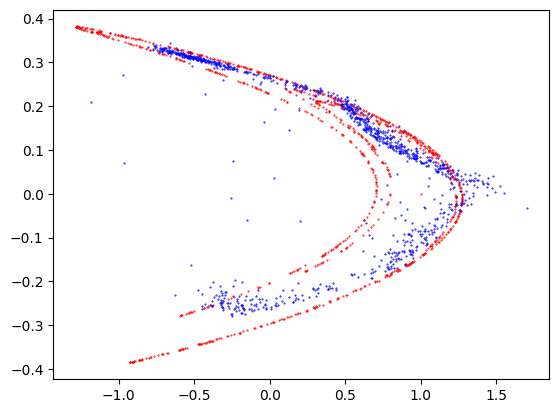

32/32 [==============================] - 0s 539us/step
15299 0.7829999923706055 0.20800000429153442


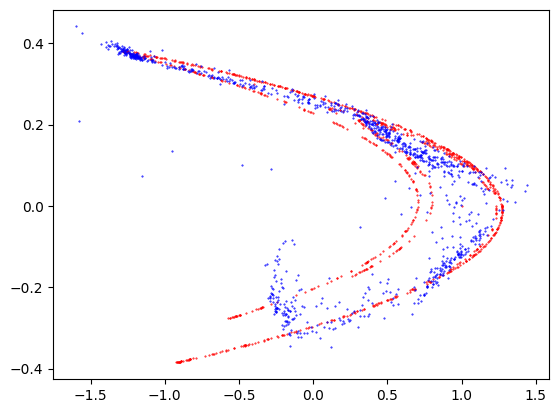

32/32 [==============================] - 0s 541us/step
15399 0.1850000023841858 0.8119999766349792


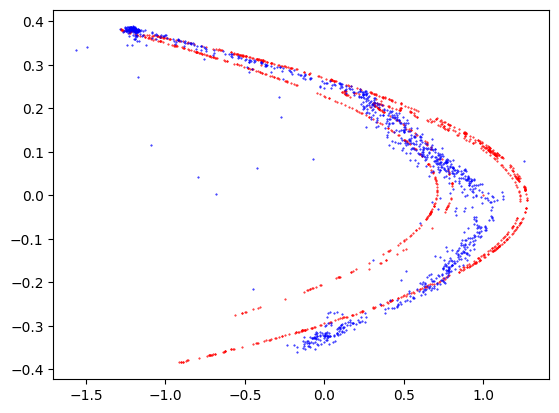

32/32 [==============================] - 0s 530us/step
15499 0.4560000002384186 0.4359999895095825


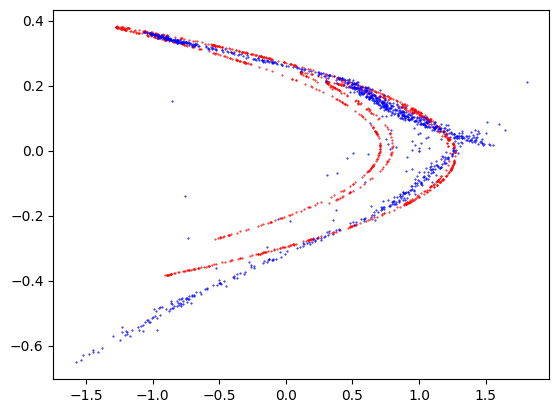

32/32 [==============================] - 0s 559us/step
15599 0.8579999804496765 0.1379999965429306


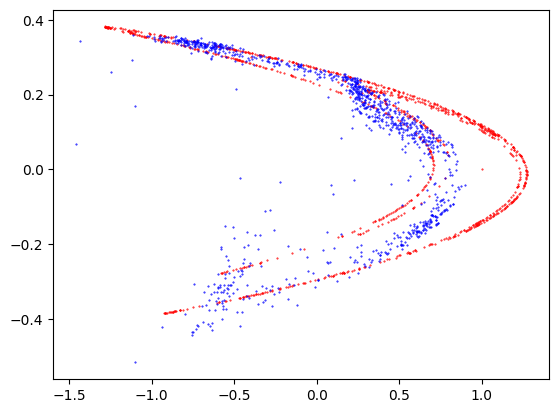

32/32 [==============================] - 0s 539us/step
15699 0.14300000667572021 0.8410000205039978


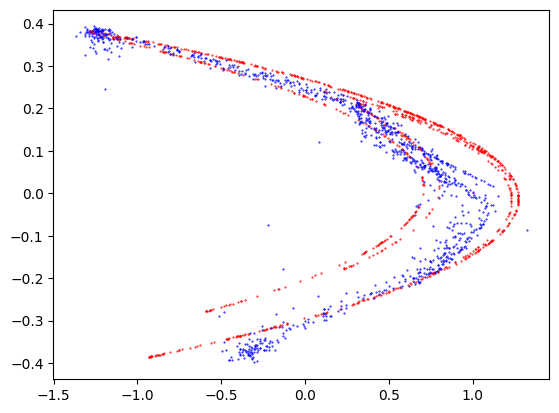

32/32 [==============================] - 0s 533us/step
15799 0.3409999907016754 0.7789999842643738


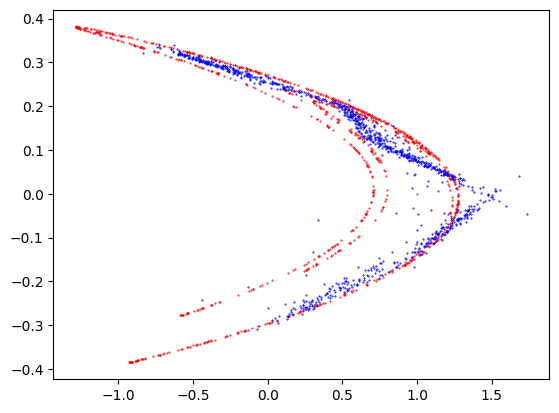

32/32 [==============================] - 0s 555us/step
15899 0.6480000019073486 0.2370000034570694


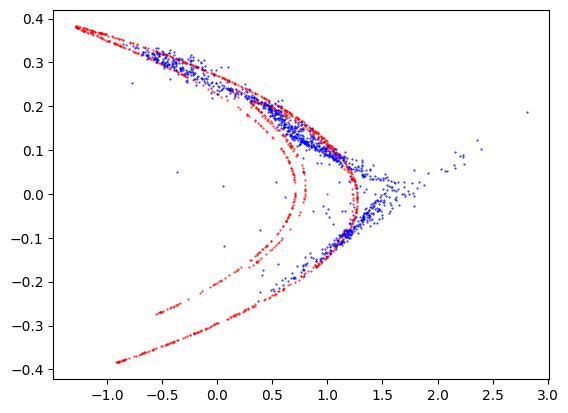

32/32 [==============================] - 0s 553us/step
15999 0.5630000233650208 0.5059999823570251


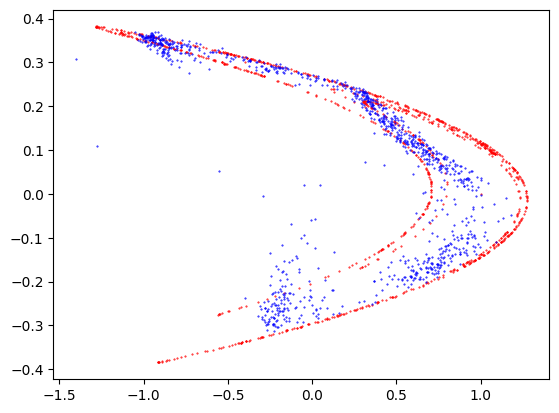

32/32 [==============================] - 0s 534us/step
16099 0.07999999821186066 0.8899999856948853


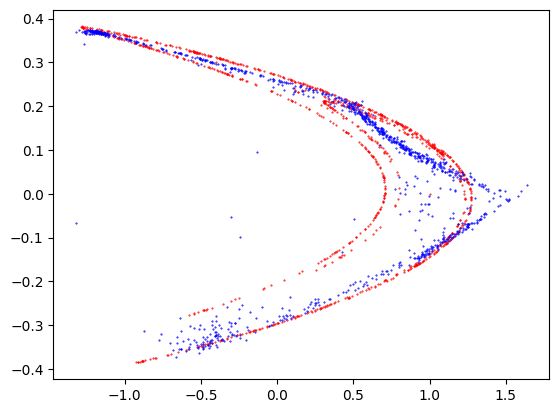

32/32 [==============================] - 0s 541us/step
16199 0.5379999876022339 0.38999998569488525


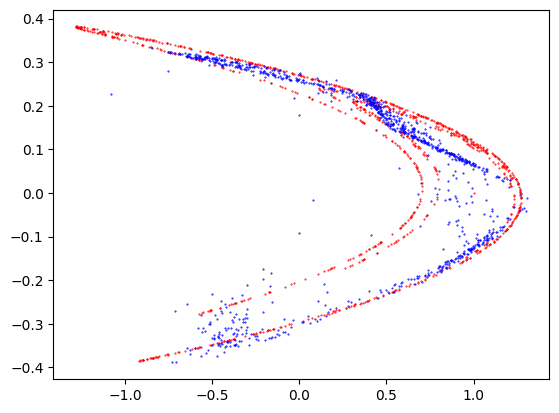

32/32 [==============================] - 0s 538us/step
16299 0.765999972820282 0.14900000393390656


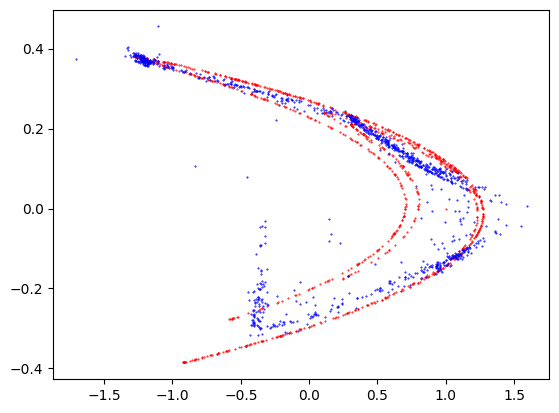

32/32 [==============================] - 0s 549us/step
16399 0.18199999630451202 0.8090000152587891


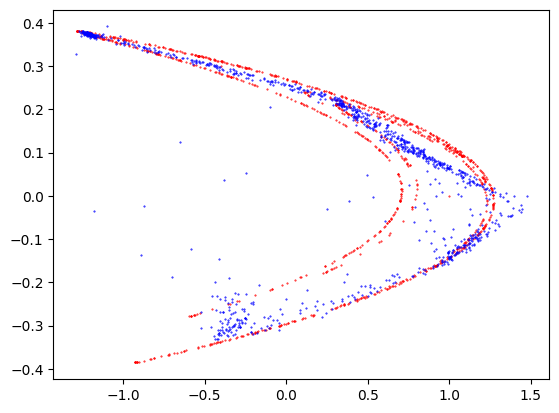

32/32 [==============================] - 0s 545us/step
16499 0.7789999842643738 0.19699999690055847


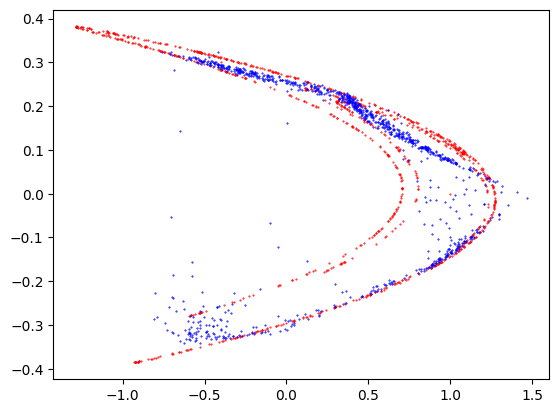

32/32 [==============================] - 0s 543us/step
16599 0.7020000219345093 0.2639999985694885


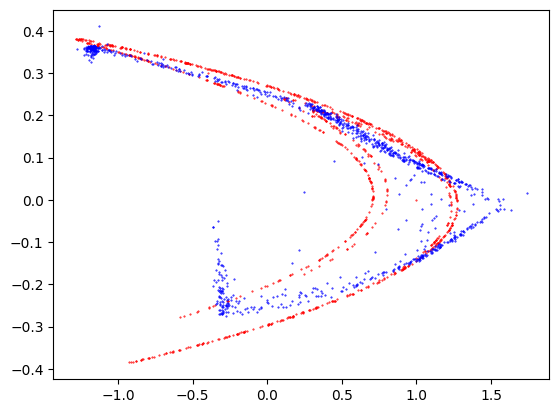

32/32 [==============================] - 0s 535us/step
16699 0.1550000011920929 0.7960000038146973


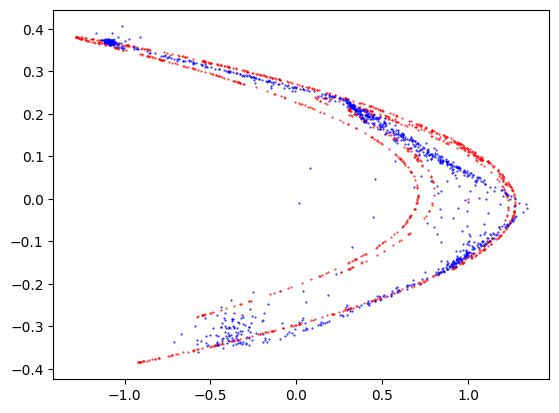

32/32 [==============================] - 0s 548us/step
16799 0.7979999780654907 0.1899999976158142


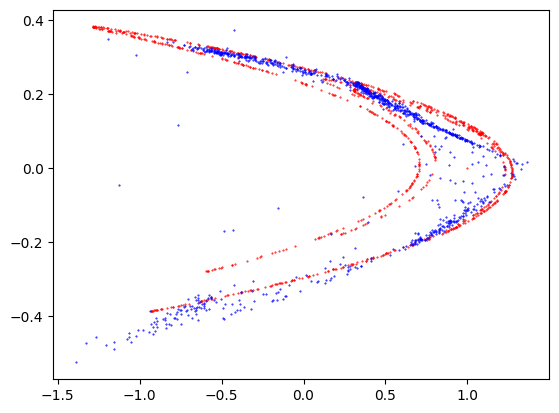

32/32 [==============================] - 0s 573us/step
16899 0.23499999940395355 0.7129999995231628


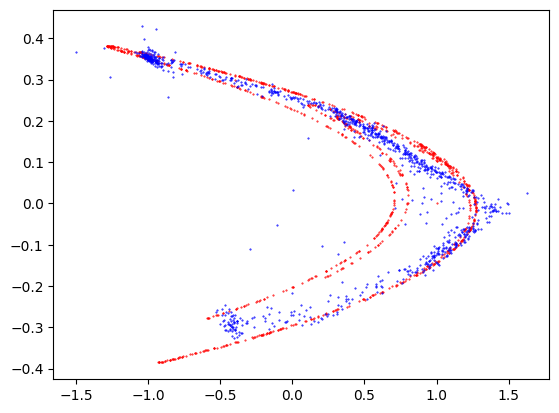

32/32 [==============================] - 0s 535us/step
16999 0.1289999932050705 0.8420000076293945


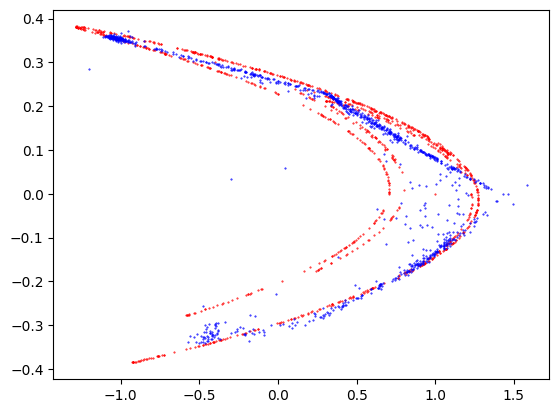

32/32 [==============================] - 0s 542us/step
17099 0.8190000057220459 0.11900000274181366


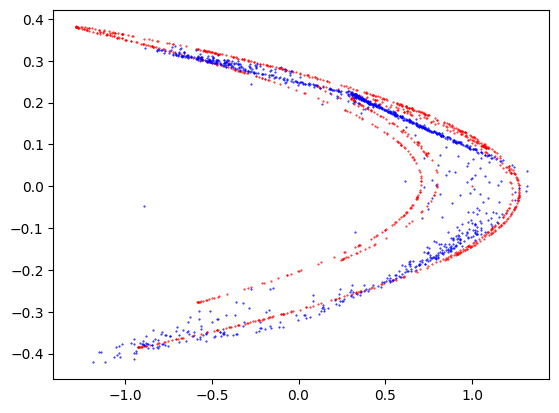

32/32 [==============================] - 0s 568us/step
17199 0.1469999998807907 0.7900000214576721


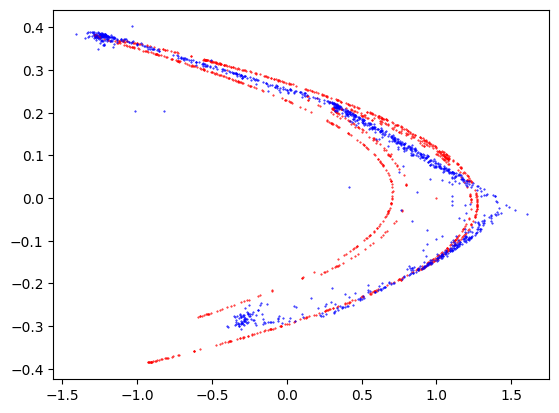

32/32 [==============================] - 0s 554us/step
17299 0.13600000739097595 0.8190000057220459


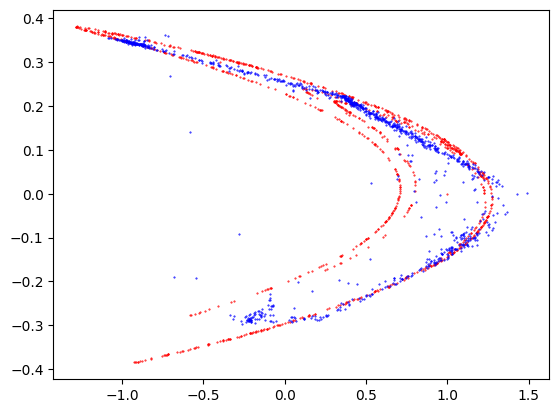

32/32 [==============================] - 0s 547us/step
17399 0.8309999704360962 0.20499999821186066


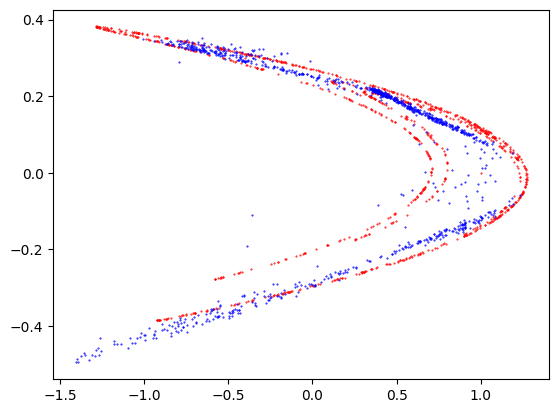

32/32 [==============================] - 0s 574us/step
17499 0.3569999933242798 0.5709999799728394


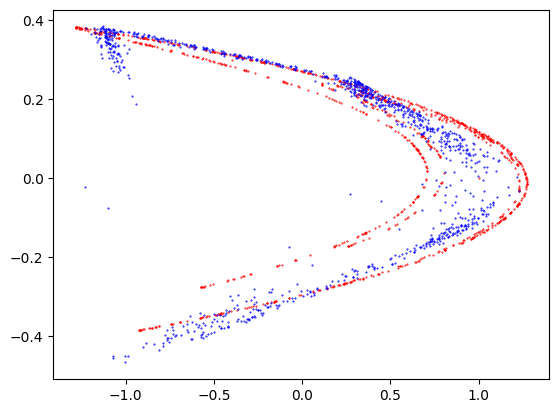

32/32 [==============================] - 0s 550us/step
17599 0.15700000524520874 0.8980000019073486


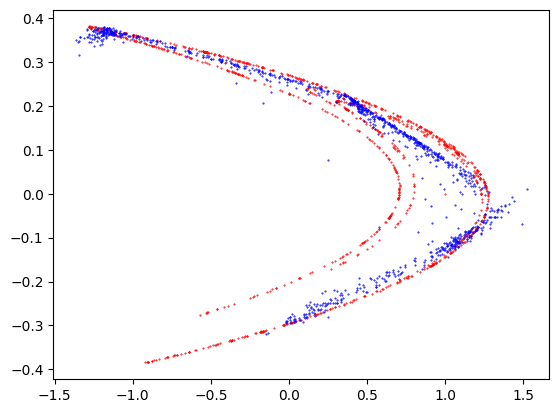

32/32 [==============================] - 0s 524us/step
17699 0.4869999885559082 0.3199999928474426


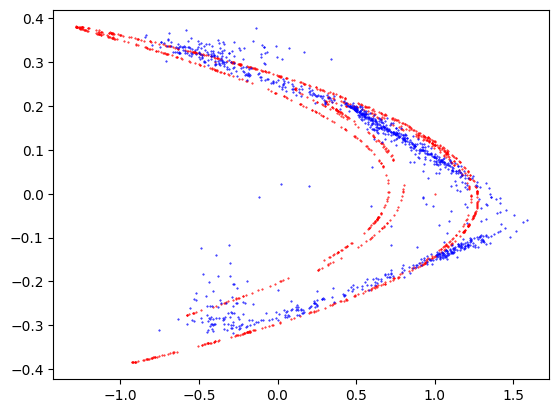

32/32 [==============================] - 0s 551us/step
17799 0.7080000042915344 0.3310000002384186


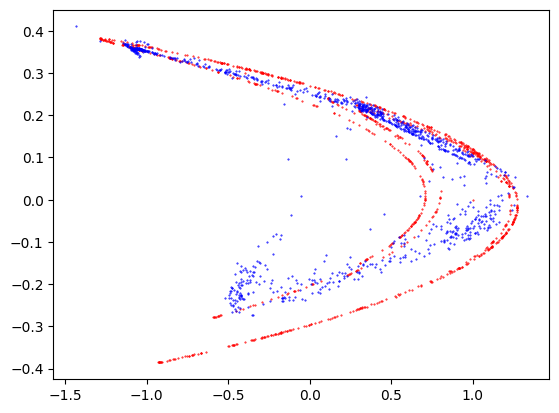

32/32 [==============================] - 0s 550us/step
17899 0.1899999976158142 0.8069999814033508


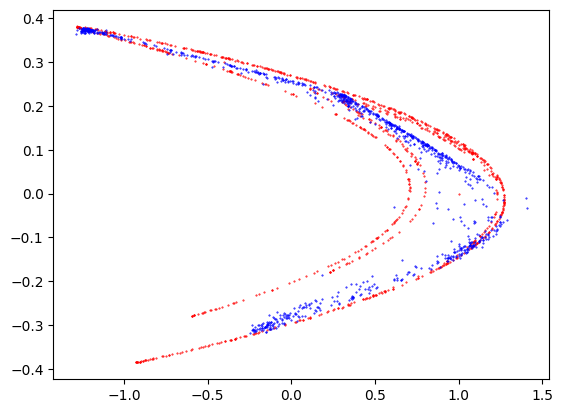

32/32 [==============================] - 0s 542us/step
17999 0.3799999952316284 0.6620000004768372


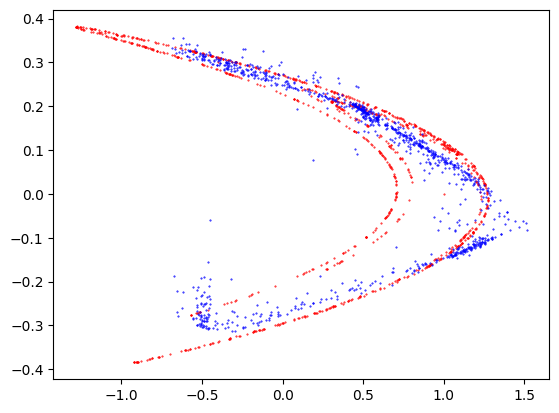

32/32 [==============================] - 0s 547us/step
18099 0.7429999709129333 0.23800000548362732


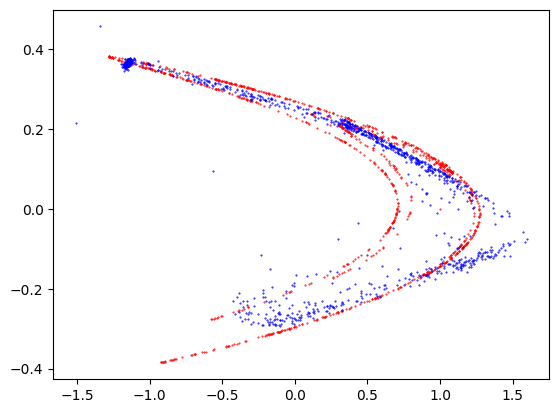

32/32 [==============================] - 0s 548us/step
18199 0.17499999701976776 0.7990000247955322


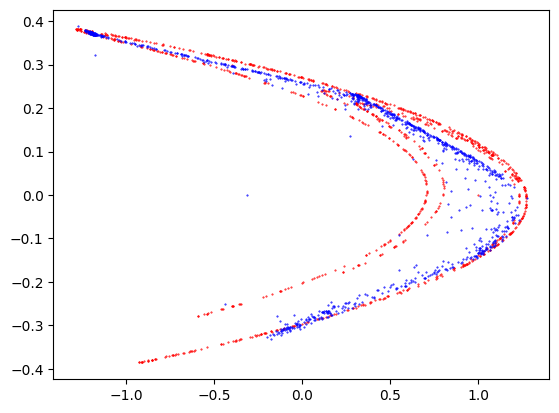

32/32 [==============================] - 0s 532us/step
18299 0.37299999594688416 0.6949999928474426


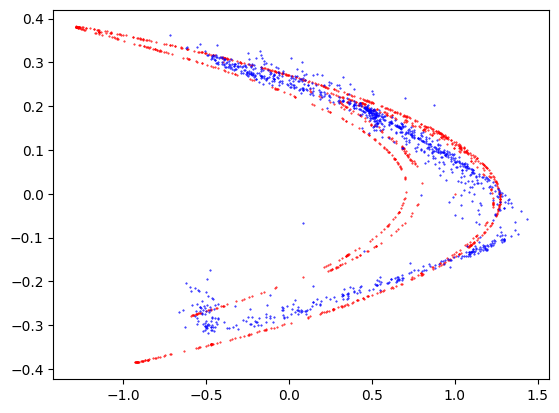

32/32 [==============================] - 0s 558us/step
18399 0.6069999933242798 0.31700000166893005


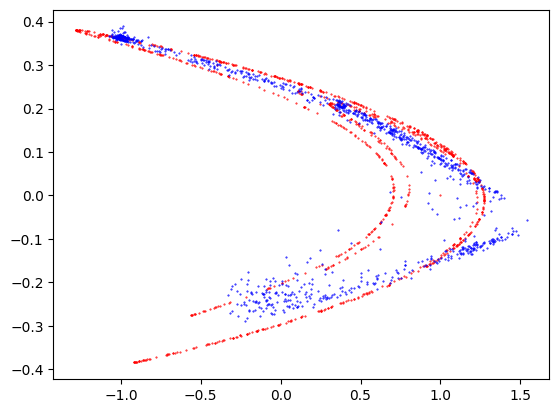

32/32 [==============================] - 0s 536us/step
18499 0.14300000667572021 0.8100000023841858


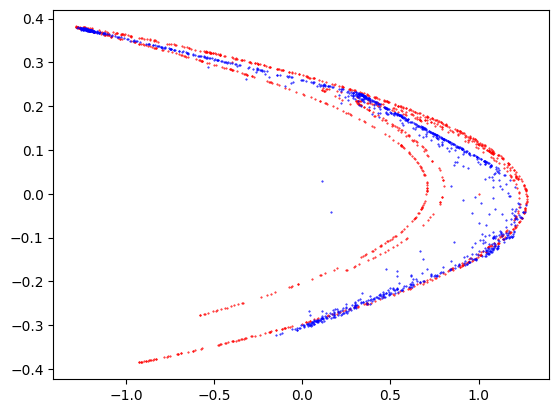

32/32 [==============================] - 0s 542us/step
18599 0.6949999928474426 0.17299999296665192


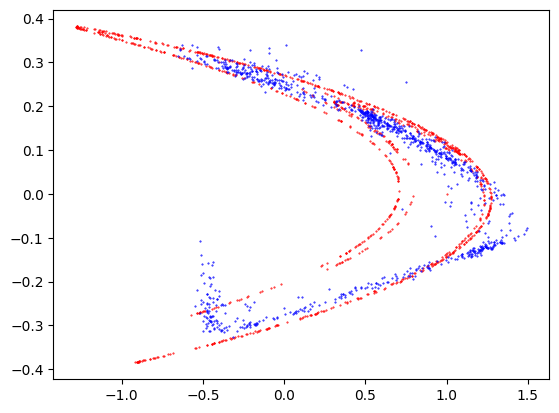

32/32 [==============================] - 0s 574us/step
18699 0.5770000219345093 0.4869999885559082


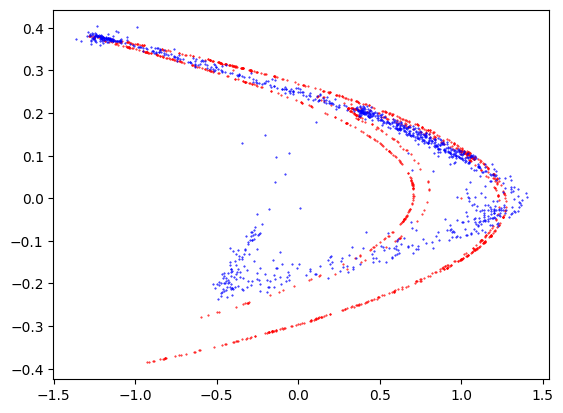

32/32 [==============================] - 0s 543us/step
18799 0.14499999582767487 0.8849999904632568


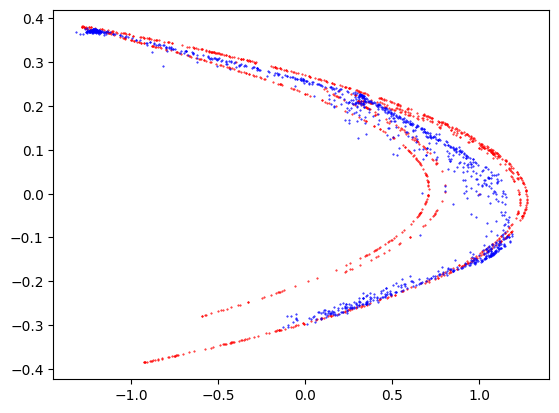

32/32 [==============================] - 0s 533us/step
18899 0.6660000085830688 0.3179999887943268


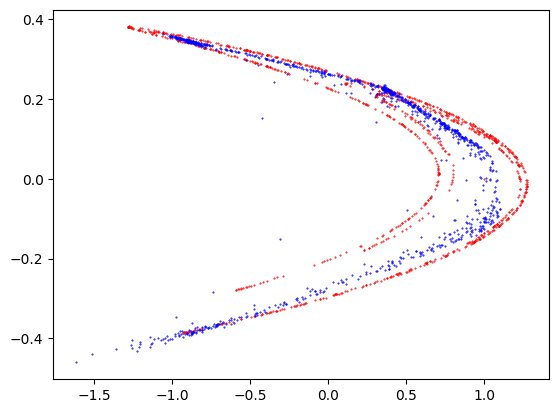

32/32 [==============================] - 0s 575us/step
18999 0.44200000166893005 0.5830000042915344


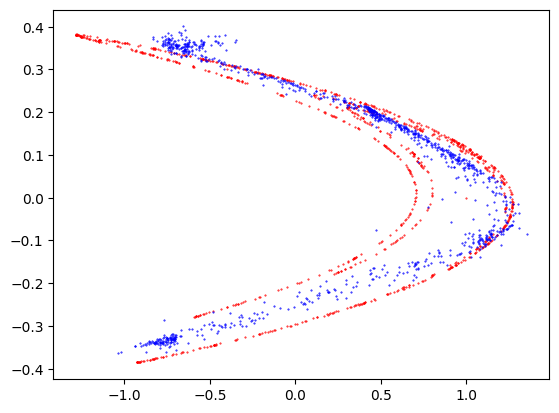

32/32 [==============================] - 0s 544us/step
19099 0.2809999883174896 0.675000011920929


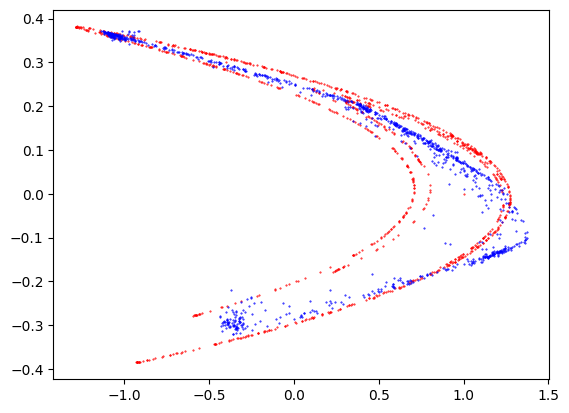

32/32 [==============================] - 0s 539us/step
19199 0.11699999868869781 0.8679999709129333


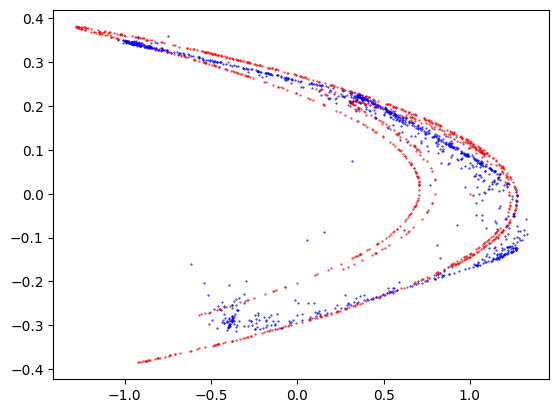

32/32 [==============================] - 0s 534us/step
19299 0.7049999833106995 0.20399999618530273


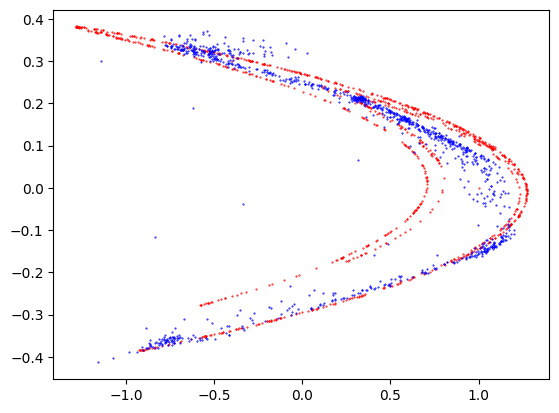

32/32 [==============================] - 0s 574us/step
19399 0.2680000066757202 0.7490000128746033


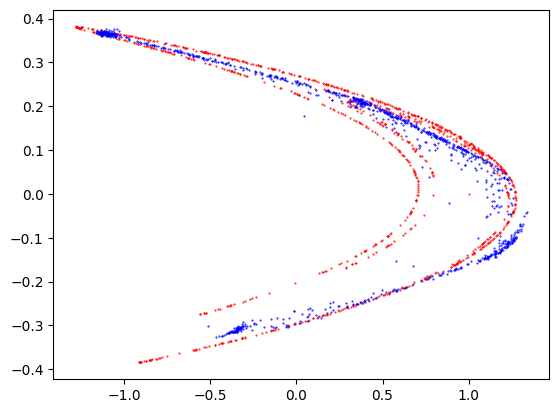

32/32 [==============================] - 0s 547us/step
19499 0.1889999955892563 0.8610000014305115


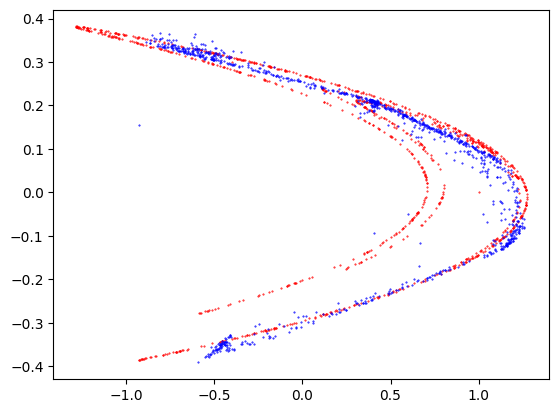

32/32 [==============================] - 0s 547us/step
19599 0.8029999732971191 0.1809999942779541


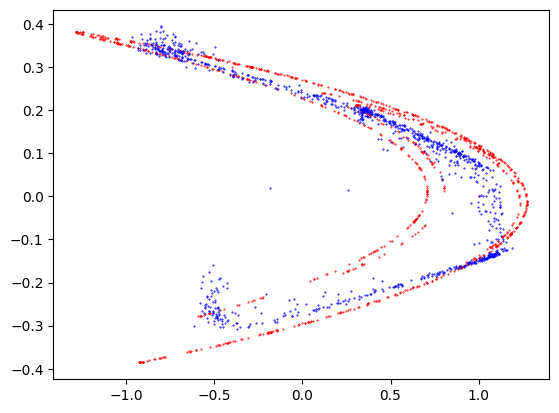

32/32 [==============================] - 0s 546us/step
19699 0.15199999511241913 0.9049999713897705


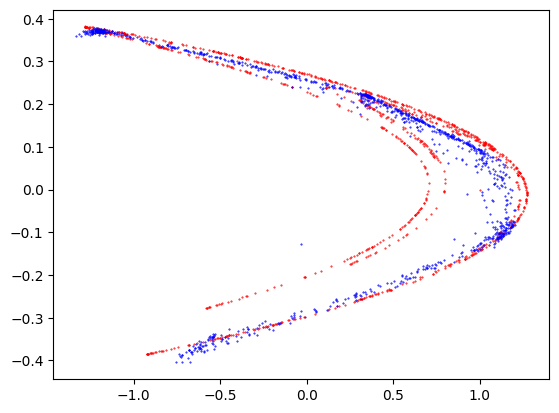

32/32 [==============================] - 0s 541us/step
19799 0.4050000011920929 0.621999979019165


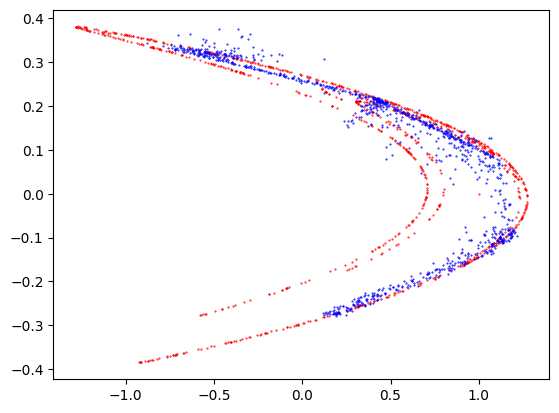

32/32 [==============================] - 0s 567us/step
19899 0.460999995470047 0.5099999904632568


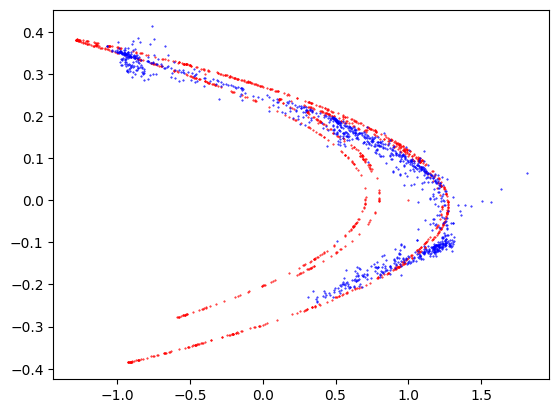

32/32 [==============================] - 0s 564us/step
19999 0.6029999852180481 0.3619999885559082


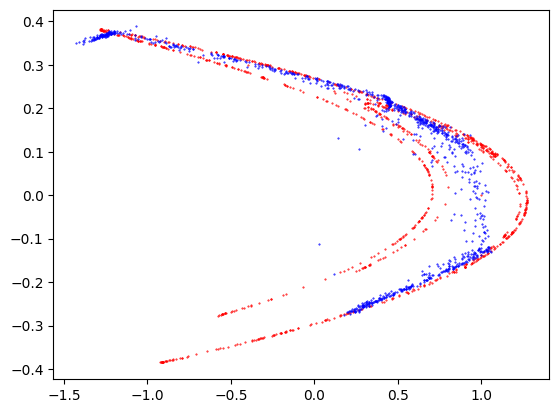

32/32 [==============================] - 0s 539us/step
20099 0.42100000381469727 0.5170000195503235


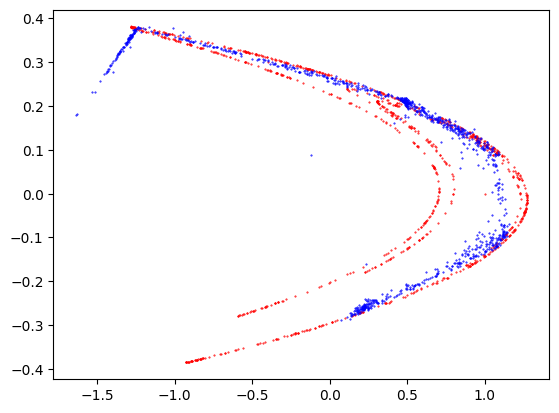

32/32 [==============================] - 0s 632us/step
20199 0.5730000138282776 0.17900000512599945


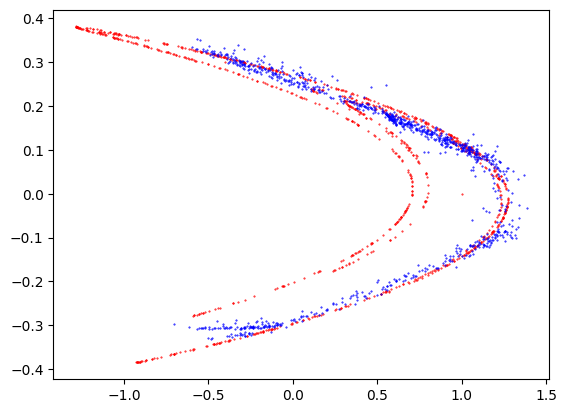

32/32 [==============================] - 0s 624us/step
20299 0.2669999897480011 0.7279999852180481


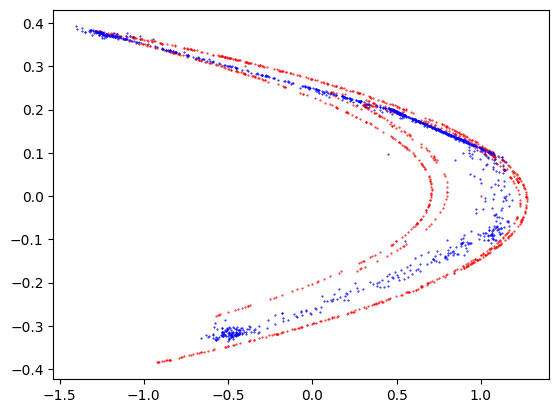

32/32 [==============================] - 0s 686us/step
20399 0.1420000046491623 0.878000020980835


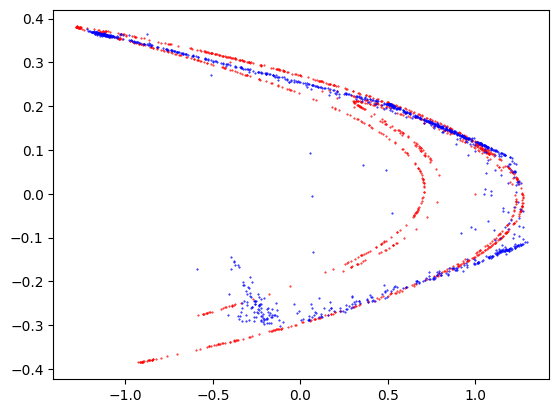

32/32 [==============================] - 0s 706us/step
20499 0.33799999952316284 0.6970000267028809


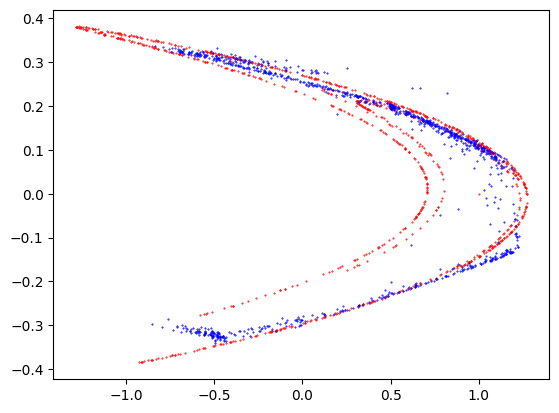

32/32 [==============================] - 0s 671us/step
20599 0.5669999718666077 0.38600000739097595


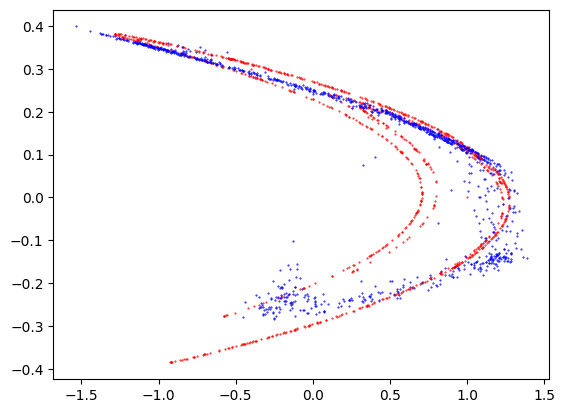

32/32 [==============================] - 0s 580us/step
20699 0.1850000023841858 0.7680000066757202


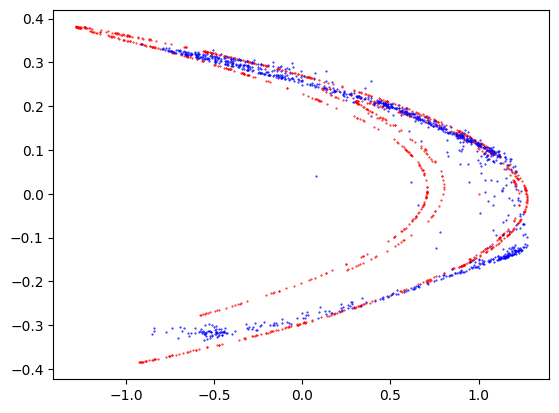

32/32 [==============================] - 0s 660us/step
20799 0.7620000243186951 0.19699999690055847


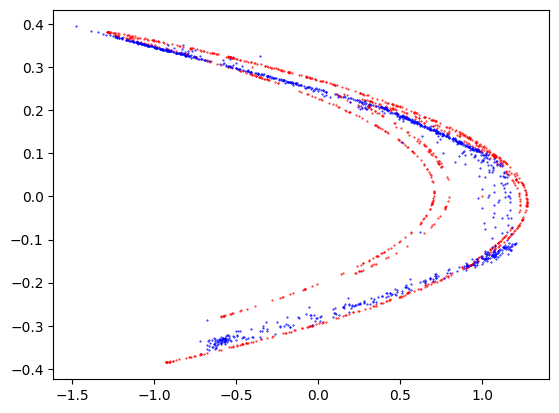

32/32 [==============================] - 0s 639us/step
20899 0.5860000252723694 0.45500001311302185


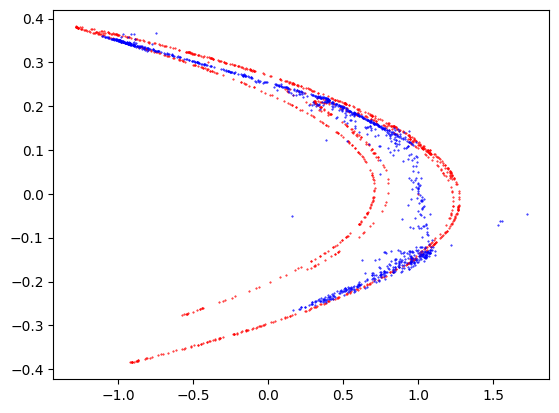

32/32 [==============================] - 0s 682us/step
20999 0.6620000004768372 0.3840000033378601


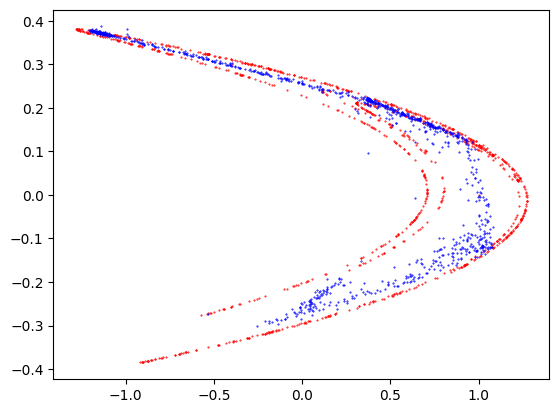

32/32 [==============================] - 0s 632us/step
21099 0.6639999747276306 0.24300000071525574


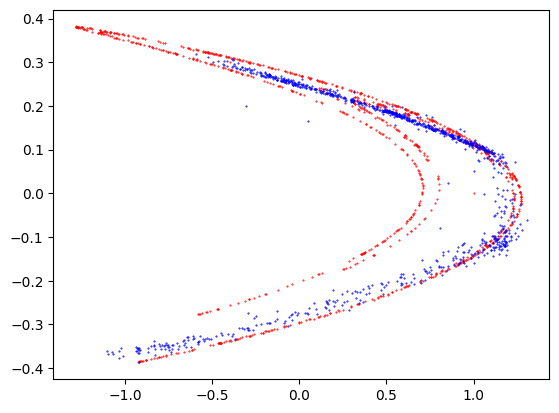

32/32 [==============================] - 0s 674us/step
21199 0.5550000071525574 0.41499999165534973


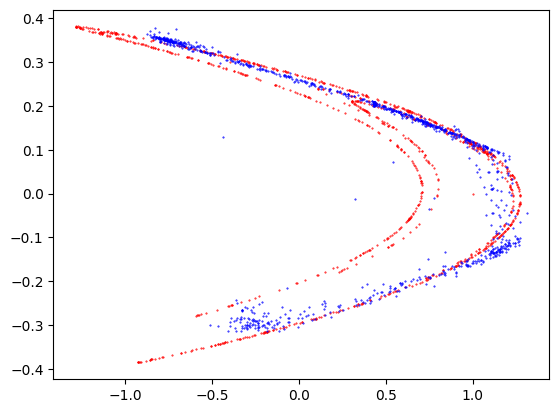

32/32 [==============================] - 0s 691us/step
21299 0.0729999989271164 0.9449999928474426


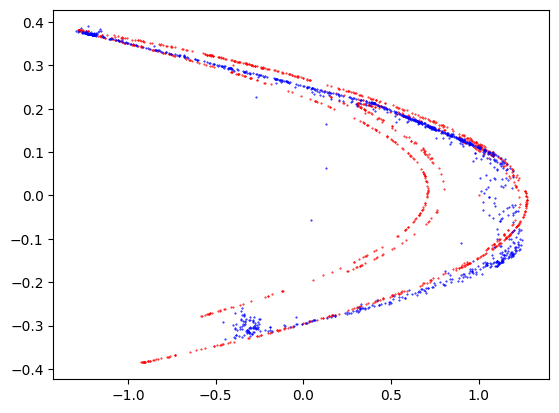

32/32 [==============================] - 0s 660us/step
21399 0.10400000214576721 0.9259999990463257


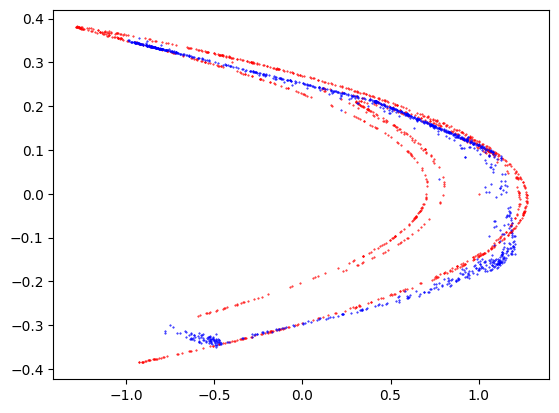

32/32 [==============================] - 0s 695us/step
21499 0.49900001287460327 0.4359999895095825


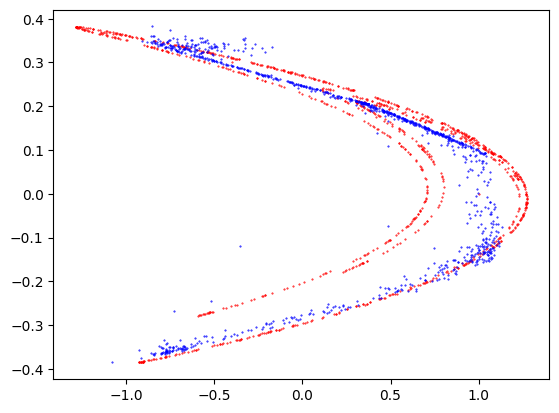

32/32 [==============================] - 0s 647us/step
21599 0.5009999871253967 0.46399998664855957


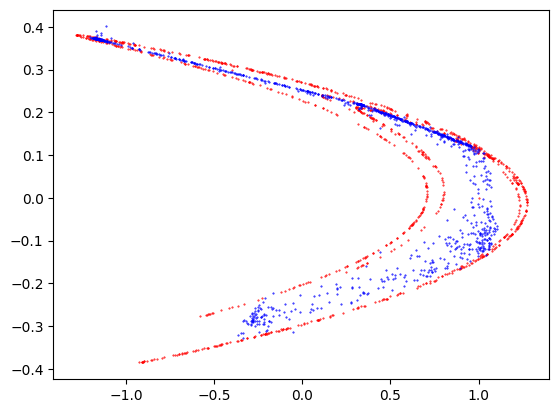

32/32 [==============================] - 0s 652us/step
21699 0.21799999475479126 0.7889999747276306


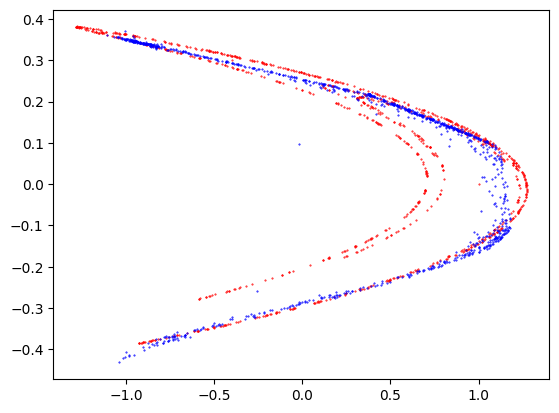

32/32 [==============================] - 0s 630us/step
21799 0.8059999942779541 0.17399999499320984


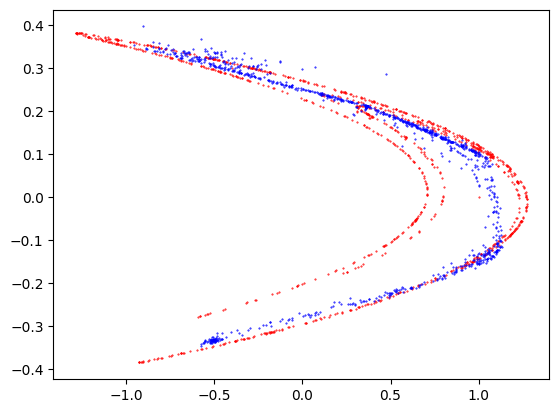

32/32 [==============================] - 0s 649us/step
21899 0.6579999923706055 0.27300000190734863


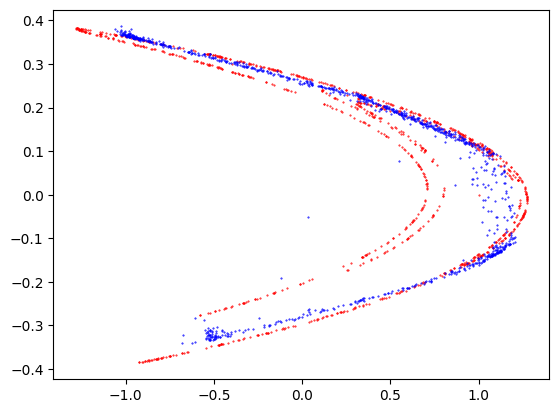

32/32 [==============================] - 0s 645us/step
21999 0.6320000290870667 0.3199999928474426


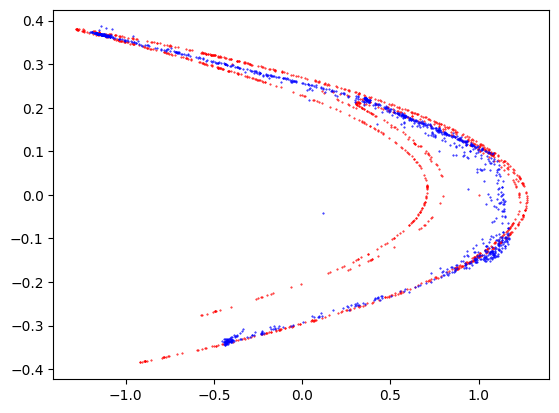

32/32 [==============================] - 0s 662us/step
22099 0.5590000152587891 0.47999998927116394


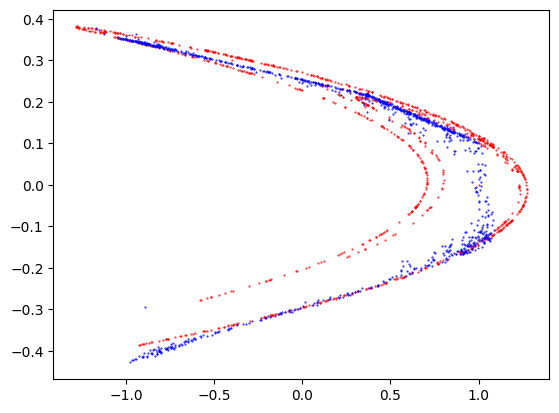

32/32 [==============================] - 0s 642us/step
22199 0.36000001430511475 0.5450000166893005


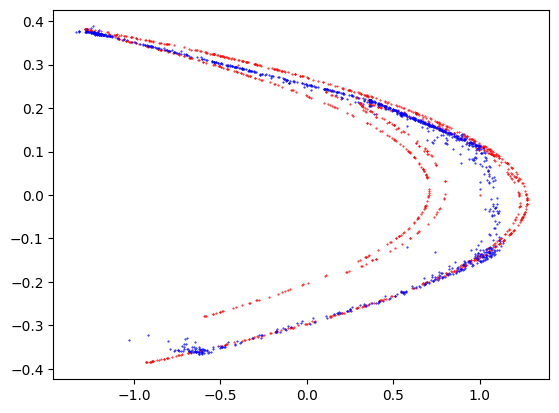

32/32 [==============================] - 0s 602us/step
22299 0.2759999930858612 0.7400000095367432


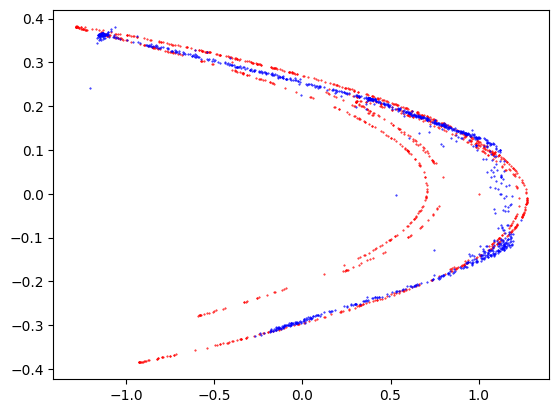

32/32 [==============================] - 0s 677us/step
22399 0.8109999895095825 0.2150000035762787


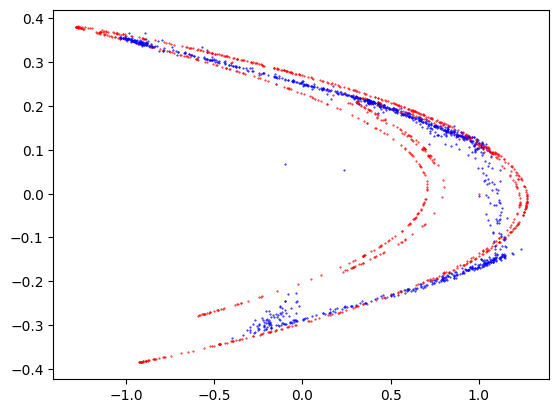

32/32 [==============================] - 0s 652us/step
22499 0.23800000548362732 0.7710000276565552


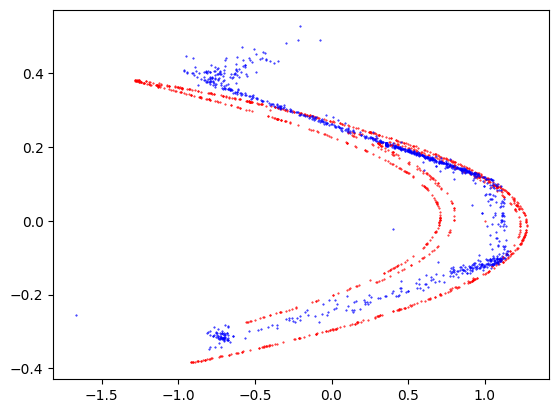

32/32 [==============================] - 0s 670us/step
22599 0.30799999833106995 0.6800000071525574


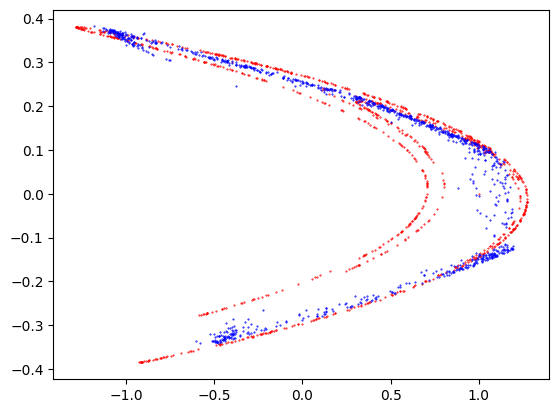

32/32 [==============================] - 0s 628us/step
22699 0.1720000058412552 0.8069999814033508


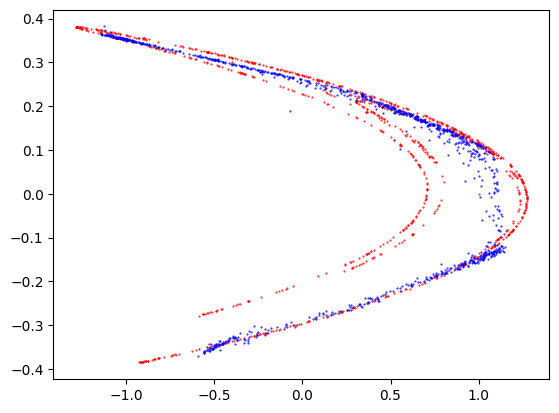

32/32 [==============================] - 0s 610us/step
22799 0.34299999475479126 0.6679999828338623


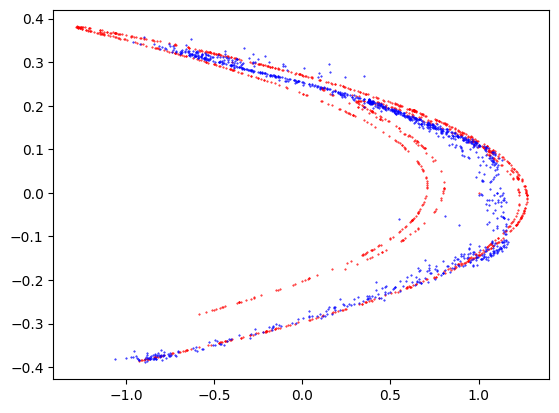

32/32 [==============================] - 0s 671us/step
22899 0.3370000123977661 0.5529999732971191


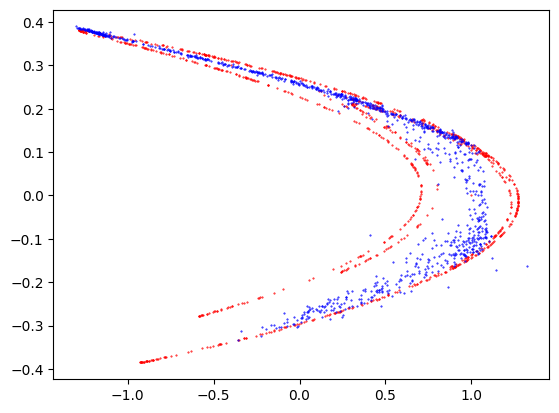

32/32 [==============================] - 0s 602us/step
22999 0.5730000138282776 0.41999998688697815


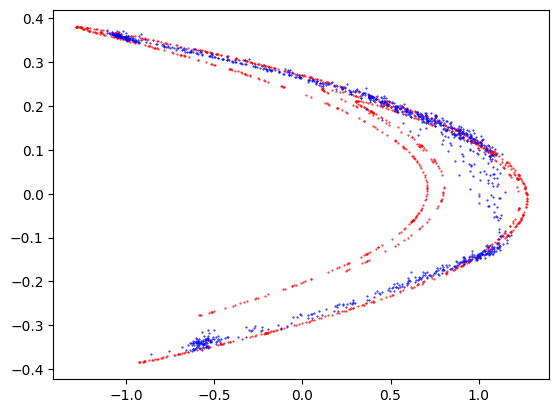

32/32 [==============================] - 0s 594us/step
23099 0.32600000500679016 0.6520000100135803


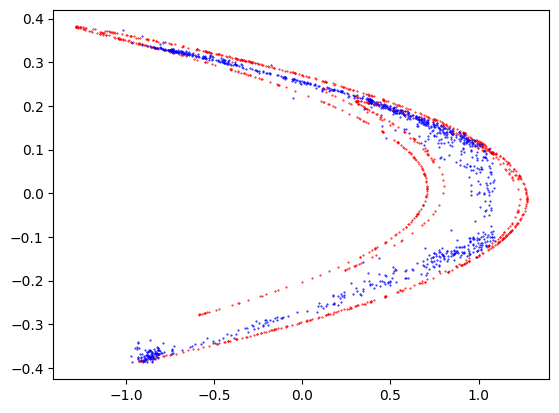

32/32 [==============================] - 0s 675us/step
23199 0.2460000067949295 0.6970000267028809


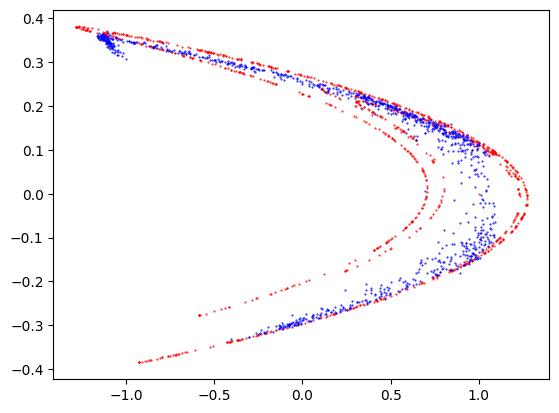

32/32 [==============================] - 0s 641us/step
23299 0.1599999964237213 0.9580000042915344


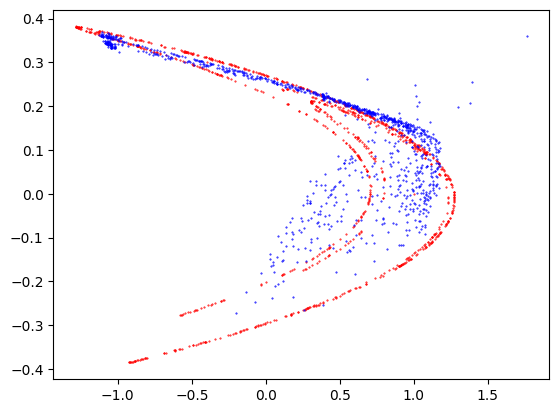

32/32 [==============================] - 0s 700us/step
23399 0.7229999899864197 0.26600000262260437


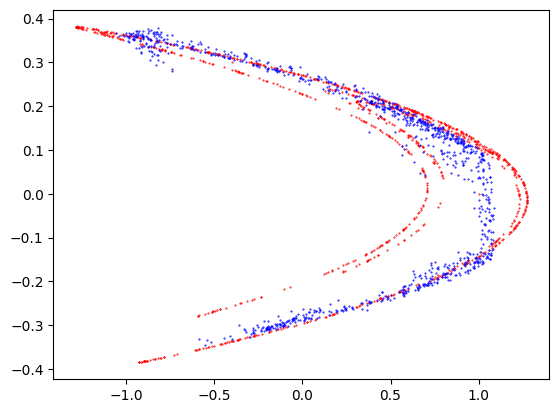

32/32 [==============================] - 0s 650us/step
23499 0.24199999868869781 0.699999988079071


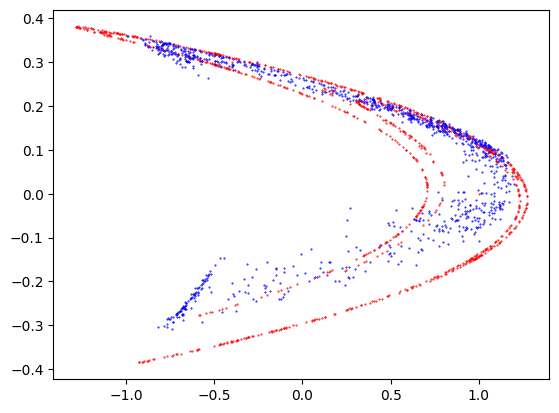

32/32 [==============================] - 0s 608us/step
23599 0.17000000178813934 0.8130000233650208


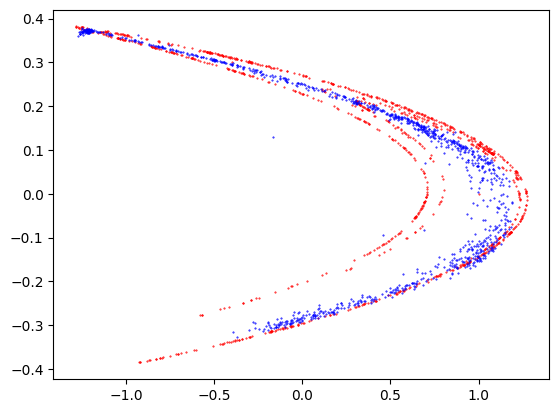

32/32 [==============================] - 0s 609us/step
23699 0.24199999868869781 0.7749999761581421


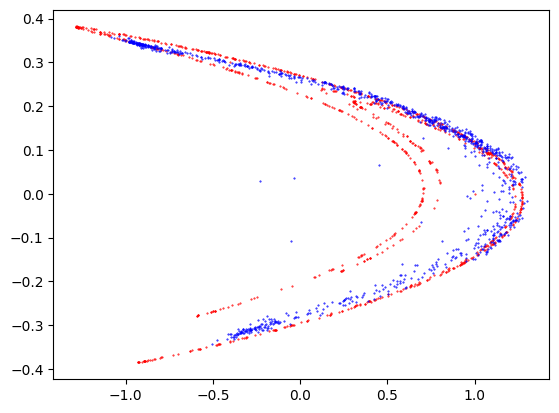

32/32 [==============================] - 0s 628us/step
23799 0.15800000727176666 0.8859999775886536


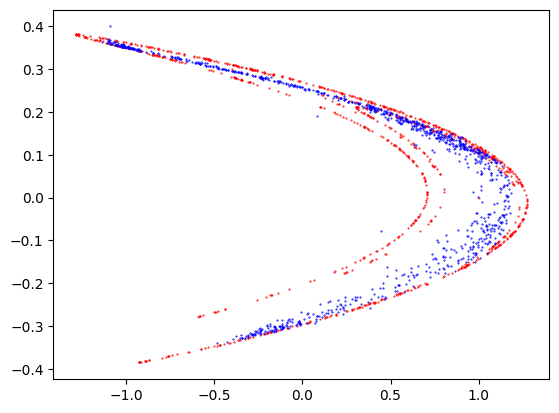

32/32 [==============================] - 0s 599us/step
23899 0.6110000014305115 0.34700000286102295


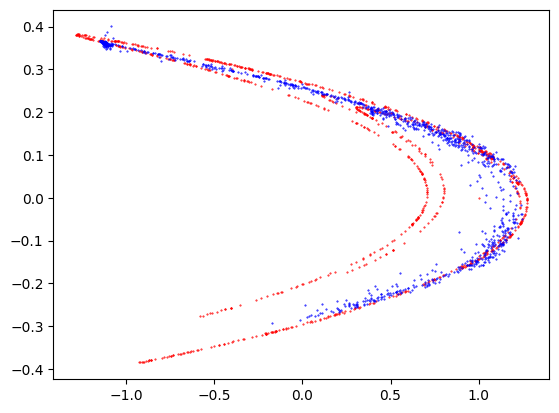

32/32 [==============================] - 0s 727us/step
23999 0.6959999799728394 0.2750000059604645


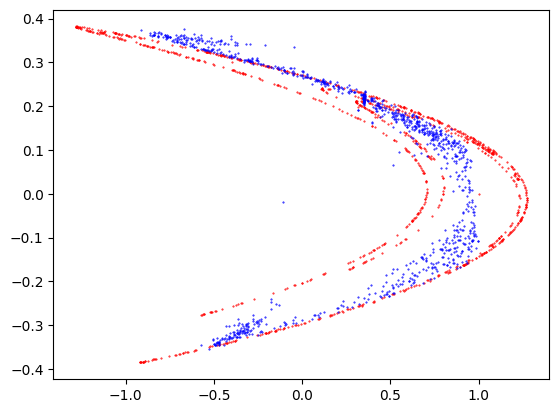

32/32 [==============================] - 0s 665us/step
24099 0.23600000143051147 0.7459999918937683


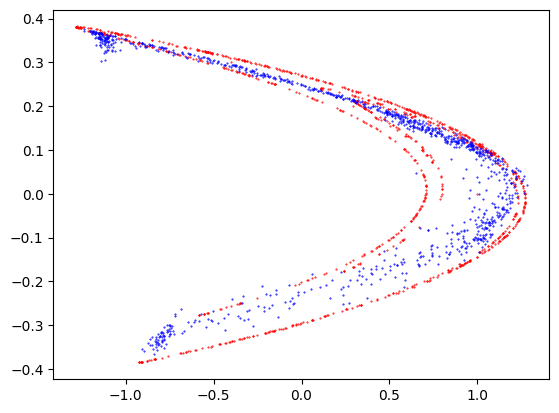

32/32 [==============================] - 0s 632us/step
24199 0.06499999761581421 0.9290000200271606


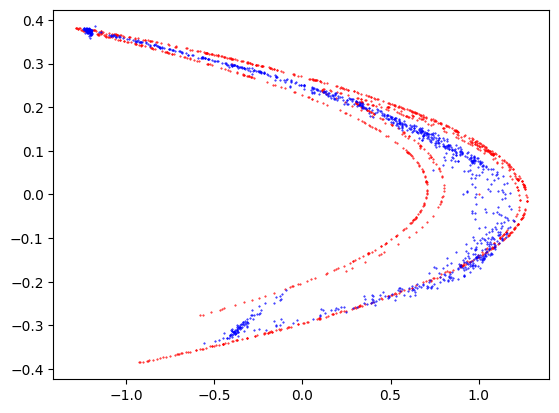

32/32 [==============================] - 0s 696us/step
24299 0.25699999928474426 0.7459999918937683


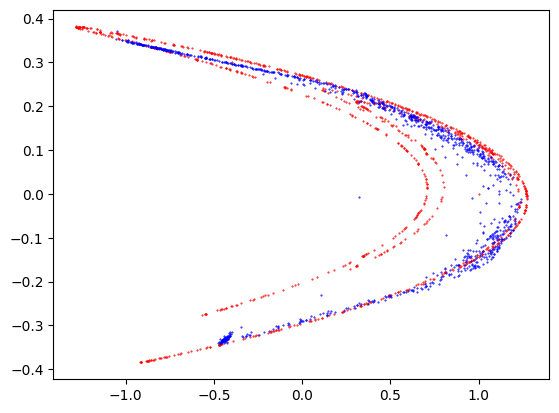

32/32 [==============================] - 0s 648us/step
24399 0.7850000262260437 0.23499999940395355


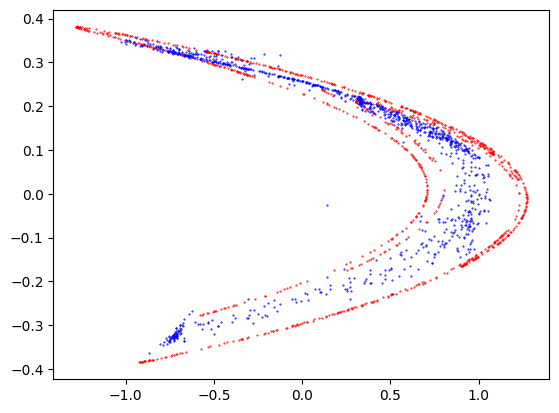

32/32 [==============================] - 0s 611us/step
24499 0.5320000052452087 0.42800000309944153


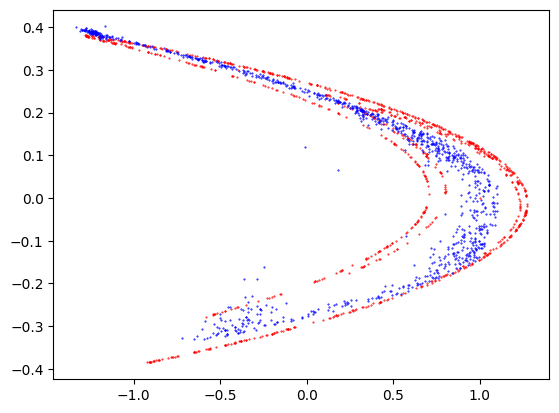

32/32 [==============================] - 0s 659us/step
24599 0.12099999934434891 0.8809999823570251


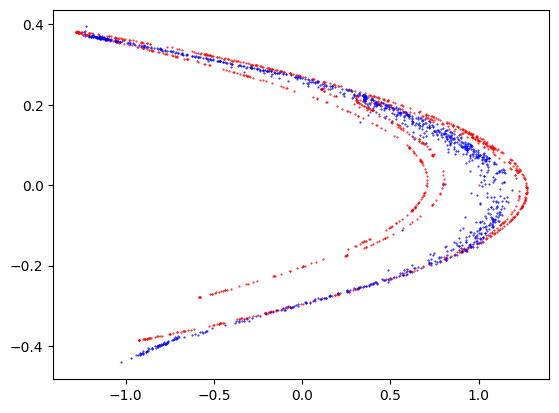

32/32 [==============================] - 0s 656us/step
24699 0.5230000019073486 0.48399999737739563


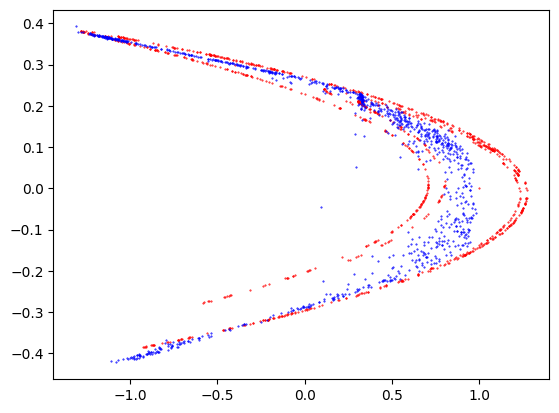

32/32 [==============================] - 0s 675us/step
24799 0.3700000047683716 0.6349999904632568


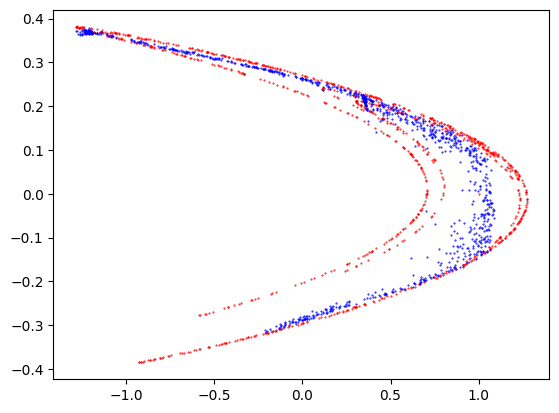

32/32 [==============================] - 0s 672us/step
24899 0.875 0.1289999932050705


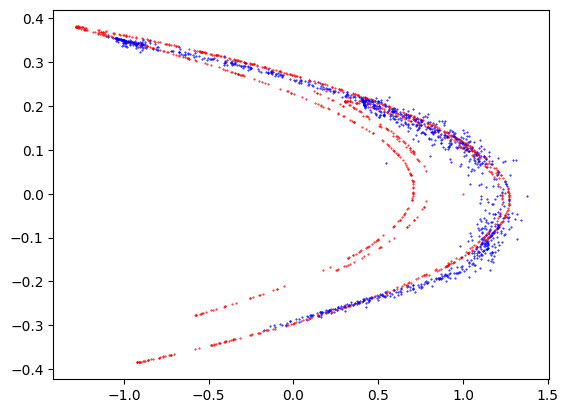

32/32 [==============================] - 0s 668us/step
24999 0.7620000243186951 0.23000000417232513


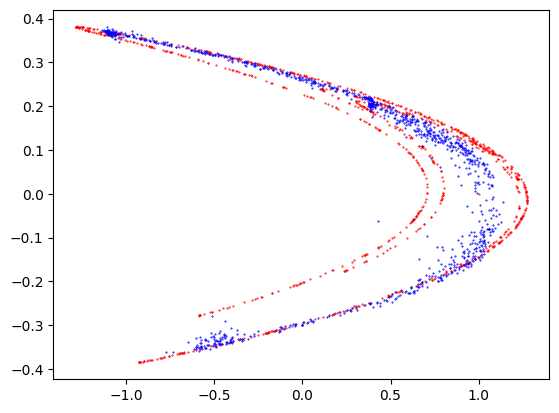

In [2]:
discriminator = D()
latent_dim = 5
generator = G(latent_dim)
gan_model = GAN(generator, discriminator)
train(generator, discriminator, gan_model, latent_dim)


(array([ 45., 475., 249., 180., 216., 277., 273., 299., 304., 308., 344.,
        295., 301., 276., 275., 317., 463., 446., 568., 632., 692., 691.,
        805., 558., 451., 486., 627., 696., 980., 271.]),
 array([-0.4086107 , -0.38186172, -0.3551127 , -0.32836372, -0.30161473,
        -0.27486575, -0.24811673, -0.22136775, -0.19461875, -0.16786976,
        -0.14112076, -0.11437177, -0.08762278, -0.06087378, -0.03412478,
        -0.00737579,  0.0193732 ,  0.0461222 ,  0.07287119,  0.09962019,
         0.12636918,  0.15311818,  0.17986716,  0.20661616,  0.23336515,
         0.26011413,  0.28686315,  0.31361213,  0.34036112,  0.36711013,
         0.39385912], dtype=float32),
 <BarContainer object of 30 artists>)

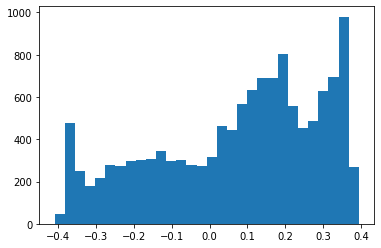

In [84]:
import matplotlib.pyplot as plt
plt.hist(data1,bins=30)

(array([1323.,  823.,  835.,  729., 1611., 1000.,  828.,  700., 1559.,
        1442., 1460., 1416., 1059., 1038., 1005.,  894., 1513., 1255.,
        2305., 2635., 2258., 2172., 2786., 3076., 1626., 1795., 2221.,
        2900., 2270., 3366.]),
 array([-0.3853935 , -0.35981732, -0.33424115, -0.30866497, -0.28308879,
        -0.25751261, -0.23193644, -0.20636026, -0.18078408, -0.15520791,
        -0.12963173, -0.10405555, -0.07847938, -0.0529032 , -0.02732702,
        -0.00175084,  0.02382533,  0.04940151,  0.07497769,  0.10055386,
         0.12613004,  0.15170622,  0.17728239,  0.20285857,  0.22843475,
         0.25401093,  0.2795871 ,  0.30516328,  0.33073946,  0.35631563,
         0.38189181]),
 <BarContainer object of 30 artists>)

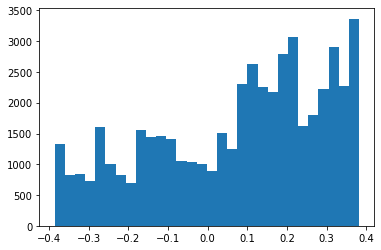

In [85]:
import numpy as np
data0 = []
data1 = []
for i in range(0,100):   
    blah_i = np.array(Henon(1.4, 0.3, n_points=500, x0=0.1, y0=0.000001*(1+randn(1))))
    blah_i0 = blah_i[:,0]
    blah_i1 = blah_i[:,1]
    #blah_i = data_G(generator, 5, 128)
    #blah_i0 = blah_i[0][:,0]
    # blah_i1 = blah_i[0][:,1]
    data0.append(blah_i0)
    data1.append(blah_i1)
data0 = np.array(data0)
data1 = np.array(data1)
data0 = data0.flatten()
data1 = data1.flatten()
import matplotlib.pyplot as plt
plt.hist(data1,bins=30)

4/4 [==============================] - 0s 768us/step


(array([  15.,  240., 2723., 1108.,  936., 1193., 1243., 1437., 1603.,
        1600., 1682., 1601., 1563., 1561., 1431., 1473., 1938., 2426.,
        2916., 3267., 3514., 3580., 4248., 3088., 2274., 2424., 3299.,
        3660., 5312.,  645.]),
 array([-0.43376815, -0.40602002, -0.37827188, -0.35052374, -0.3227756 ,
        -0.29502743, -0.2672793 , -0.23953117, -0.21178302, -0.18403488,
        -0.15628675, -0.12853861, -0.10079046, -0.07304233, -0.04529418,
        -0.01754604,  0.0102021 ,  0.03795024,  0.06569838,  0.09344652,
         0.12119466,  0.1489428 ,  0.17669094,  0.20443909,  0.23218723,
         0.25993538,  0.28768352,  0.31543165,  0.3431798 ,  0.37092793,
         0.39867607], dtype=float32),
 <BarContainer object of 30 artists>)

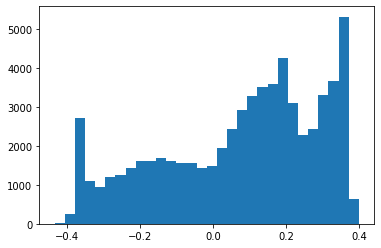

In [86]:
import numpy as np
data0 = []
data1 = []
for i in range(0,500):   
    blah_i = data_G(generator, 5, 128)
    blah_i0 = blah_i[0][:,0]
    blah_i1 = blah_i[0][:,1]
    data0.append(blah_i0)
    data1.append(blah_i1)
data0 = np.array(data0)
data1 = np.array(data1)
data0 = data0.flatten()
data1 = data1.flatten()
import matplotlib.pyplot as plt
plt.hist(data1,bins=30)

In [3]:
blah = data_G(generator, 5, 128)
plt.scatter(blah[0][:,0],blah[0][:,1])

NameError: name 'data_G' is not defined

32/32 [==============================] - 0s 525us/step


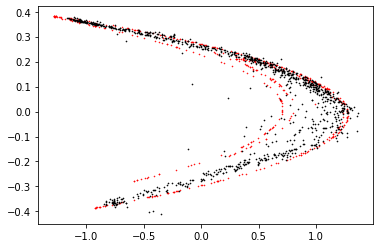

In [72]:
blah1 = np.array(Henon(1.4, 0.3, n_points=500, x0=0.1, y0=0.00001*(1+randn(1))))
plt.scatter(blah1[:,0],blah1[:,1], color = 'red',s=0.3)
blah2 = np.array(Henon(1.4, 0.3, n_points=500, x0=0.1, y0=0.00001*(1+randn(1))))
#plt.scatter(blah2[:,0],blah2[:,1],  color = 'blue',s=0.3)
blah3 = np.array(Henon(1.4, 0.3, n_points=500, x0=0.1, y0=0.00001*(1+randn(1))))
#plt.scatter(blah3[:,0],blah3[:,1],  color = 'green',s=0.3)
blah = data_G(generator, 5, 1000)
plt.scatter(blah[0][:,0],blah[0][:,1],color = 'black', s=0.4)

In [4]:
blah = data_G(generator, 5, 128)
plt.scatter(blah[0][:,0],blah[0][:,1])

NameError: name 'data_G' is not defined